# EXPLORATORY DATA ANALYSIS & DATA CLEANING of `Hepatitis` Data

## Author: [Michael Holdbrooke](mickybroox@gmail.com)

### Date: 20th April, 2021


![AddictivePtyhon](src/AddictivePython.png)

## Import Libraries

In [1]:
# %%writefile eda_data_cleaning.py

# Import the iconic trio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import rcParams

# Set plots style
plt.style.use('fivethirtyeight')

# Import seaborn for style and beauty
import seaborn as sns

# Set context
sns.set_context('paper')

# custom
from custom import helper

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

### Style Tables

In [2]:
%%HTML
<style type='text/css'>
table.dataframe th, table.dataframe td{
    border: 6px solid orchid !important;
    color: solid black !important;
}
</style>

### Modify the number of Columns to Display

In [3]:
pd.options.display.max_columns = None

## Load Dataset

In [4]:
raw_data = pd.read_csv("data/hepatitis.data")
raw_data.head()

,2,30,2.1,1,2.2,2.3,2.4,2.5,1.1,2.6,2.7,2.8,2.9,2.10,1.00,85,18,4.0,?,1.2
0,2,50,1,1,2,1,2,2,1,2,2,2,2,2,0.90,135,42,3.5,?,1
1,2,78,1,2,2,1,2,2,2,2,2,2,2,2,0.70,96,32,4.0,?,1
2,2,31,1,?,1,2,2,2,2,2,2,2,2,2,0.70,46,52,4.0,80,1
3,2,34,1,2,2,2,2,2,2,2,2,2,2,2,1.00,?,200,4.0,?,1
4,2,34,1,2,2,2,2,2,2,2,2,2,2,2,0.90,95,28,4.0,75,1


### Attribute information; The dataset consist of 20 data features and they are:

- **`Class`**: DIE, LIVE

- **`AGE`**: 10, 20, 30, 40, 50, 60, 70, 80

- **`SEX`**: male, female

- **`STEROID`**: no, yes

- **`ANTIVIRALS`**: no, yes

- **`FATIGUE`**: no, yes

- **`MALAISE`**: no, yes

- **`ANOREXIA`**: no, yes

- **`LIVER BIG`**: no, yes

- **`LIVER FIRM`**: no, yes

- **`SPLEEN PALPABLE`**: no, yes

- **`SPIDERS`**: no, yes

- **`ASCITES`**: no, yes

- **`VARICES`**: no, yes

- **`BILIRUBIN`**: 0.39, 0.80, 1.20, 2.00, 3.00, 4.00

- **`ALK PHOSPHATE`**: 33, 80, 120, 160, 200, 250

- **`SGOT`**: 13, 100, 200, 300, 400, 500, 

- **`ALBUMIN`**: 2.1, 3.0, 3.8, 4.5, 5.0, 6.0

- **`PROTIME`**: 10, 20, 30, 40, 50, 60, 70, 80, 90

- **`HISTOLOGY`**: no, yes

+ **`CLASS`** - **_Class determines whether a patient died or lived._**

---

+ **`AGE`** - **_Age determines how old the patient is._**

---

+ **`SEX`** - **_Sex indicates the gender of the patient._**

---

+ **`STEROID`** - **_Steroid indicates whether there is steroid usage by the patient._**

---

+ **`ANTIVIRALS`** - **_Antivirals indicates whether there is the usage of antiviral drugs by the patient._**

---

+ **`FATIGUE`** - **_Fatigue is a term used to describe an overall feeling of tiredness or lack of energy._**

---

+ **`MALAISE`** - **_A general sense of being unwell, often accompanied by fatigue, diffuse pain or lack of interest in activities ([MedicalNewsToday](https://www.medicalnewstoday.com/articles/327062), 20th November, 2019)._**

---

+ **`ANOREXIA`** - **_An eating disorder that causes people to be obsess about their weight and what they eat ([Mayo Clinic](https://www.mayoclinic.org/diseases-conditions/anorexia-nervosa/symptoms-causes/syc-20353591))._**

---

+ **`LIVER BIG`** - **_Describes whether a patient's liver is enlarged or not. An enlarged liver is a liver that is bigger than a normal liver._**

---

+ **`LIVER FIRM`** - **_Describes whether a patient's liver is firm or not. The edges of a liver is normally thin and firm_**.

---

+ **`SPLEEN PALPABLE`** - **_Describes whether a the spleen of a patient is easily noticeable or not. The spleen is the largest organ in the lymphatic system. It is an important organ for keeping bodily fluids balanced, but it is possible to live without it._**

---

+ **`SPLEEN PALPABLE`** - **_Describes whether the spleen of a patient is easily noticeable or not. The spleed is an important organ that is part of the lymphatic system. It helps in keeping bodily fluids balanced, and also helps in removing cellular waste. ([Live Science](https://www.livescience.com/44725-spleen.html), 4th April 2018)_**

---

+ **`ASCITES`** - **_Ascites is extra fluid in the space between the tissues lining the abdomen and the organs in the abdominal cavity (such as the liver, spleen, stomach). Ascites determines whether if there's an extra fluid in the abdominal cavity of a patient_**

---

+ **`VARICES`** - **_This determines whether a patient is exhibiting varices. Varices happens when the liver becomes scarred, and the pressure from obstructed blood flow causes veins to expand._**

---

+ **`BILIRUBIN`** - **_This feature determines the bilirubin value of a patient. The level of bilirubin in the blood goes up and down in patients with hepatitis C. High levels of bilirubin can cause jaundice (yellowing of the skin and eyes, darker urine, and lighter-colored bowel movements)._** 

---

+ **`ALK PHOSPHATE`** - **_Determines the level or value of Alkaline Phosphatase of a patient. Alkaline phosphatase is an enzyme made in liver cells and bile ducts. The alkaline phosphatase level is a common test that is usually included when liver tests are performed as a group._**

---

+ **`SGOT`** - **_`Serum Glutamic-Oxaloacetic Transaminase (SGOT)` which is also known as `Aspartate Aminotransferase (AST)`, is a liver enzyme which when liver cells are damaged, leaks out into the bloodstream and increases the level of AST in the blood. This feature measures or determines the level of `SGOT` in the bloodstream of a patient_**

---

+ **`ALBUMIN`** - **_This features determines a patient's albumin level. A low albumin level in patients with hepatitis C can be a sign of cirrhosis (a liver disease). Albumin levels can go up and down slightly. Very low albumin levels can cause symptoms of edema, or fluid accumulation, in the abdomen (called ascites) or in the leg (called edema)._**

---

+ **`PROTIME`** - **_`Prothrombin Time` (PT) is one way of measuring how long it takes blood to form a clot, and it is measured in seconds (such as 13.2 seconds). A normal PT indicates that a normal amount of blood-clotting protein is available._**

---

+ **`HISTOLOGY`** - **_Histology is the study of microscopic structures of tissues. Once a tissue sample is taken from a patient, histology technicians are the people responsible for preparing samples for pathologists to examine for diagnostic or research purposes ([Mayo Clinic](https://college.mayo.edu/academics/explore-health-care-careers/careers-a-z/histology-technician/))._**


## Name the Column Heads of the Dataset Appropriately 

In [5]:
column_heads = [
    "Class",
    "AGE",
    "SEX",
    "STEROID",
    "ANTIVIRALS",
    "FATIGUE",
    "MALAISE",
    "ANOREXIA",
    "LIVER BIG",
    "LIVER FIRM",
    "SPLEEN PALPABLE",
    "SPIDERS",
    "ASCITES",
    "VARICES",
    "BILIRUBIN",
    "ALK PHOSPHATE",
    "SGOT",
    "ALBUMIN",
    "PROTIME",
    "HISTOLOGY"
]

print(f'Total number of columns: {len(column_heads)}')

Total number of columns: 20


In [6]:
# Assign column head names to the dataset
raw_data.columns = column_heads
raw_data.head()

,Class,AGE,SEX,STEROID,ANTIVIRALS,FATIGUE,MALAISE,ANOREXIA,LIVER BIG,LIVER FIRM,SPLEEN PALPABLE,SPIDERS,ASCITES,VARICES,BILIRUBIN,ALK PHOSPHATE,SGOT,ALBUMIN,PROTIME,HISTOLOGY
0,2,50,1,1,2,1,2,2,1,2,2,2,2,2,0.90,135,42,3.5,?,1
1,2,78,1,2,2,1,2,2,2,2,2,2,2,2,0.70,96,32,4.0,?,1
2,2,31,1,?,1,2,2,2,2,2,2,2,2,2,0.70,46,52,4.0,80,1
3,2,34,1,2,2,2,2,2,2,2,2,2,2,2,1.00,?,200,4.0,?,1
4,2,34,1,2,2,2,2,2,2,2,2,2,2,2,0.90,95,28,4.0,75,1


## Clean Column Head Names

In [7]:
# Convert column head names to snakecase
raw_data.columns = raw_data.columns.str.lower().str.replace(' ', '_')
raw_data.head()

,class,age,sex,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,2,50,1,1,2,1,2,2,1,2,2,2,2,2,0.90,135,42,3.5,?,1
1,2,78,1,2,2,1,2,2,2,2,2,2,2,2,0.70,96,32,4.0,?,1
2,2,31,1,?,1,2,2,2,2,2,2,2,2,2,0.70,46,52,4.0,80,1
3,2,34,1,2,2,2,2,2,2,2,2,2,2,2,1.00,?,200,4.0,?,1
4,2,34,1,2,2,2,2,2,2,2,2,2,2,2,0.90,95,28,4.0,75,1


In [8]:
# Create a Copy of the Dataset
df = raw_data.copy()
df.head()

,class,age,sex,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,2,50,1,1,2,1,2,2,1,2,2,2,2,2,0.90,135,42,3.5,?,1
1,2,78,1,2,2,1,2,2,2,2,2,2,2,2,0.70,96,32,4.0,?,1
2,2,31,1,?,1,2,2,2,2,2,2,2,2,2,0.70,46,52,4.0,80,1
3,2,34,1,2,2,2,2,2,2,2,2,2,2,2,1.00,?,200,4.0,?,1
4,2,34,1,2,2,2,2,2,2,2,2,2,2,2,0.90,95,28,4.0,75,1


## Create Folders to keep figures and tables

In [9]:
helper.create_folder('./csv_tables/')
helper.create_folder('./figures/')

---

## Check Missing Values

### Missing Attribute Values: (indicated by "`?`")

In [10]:
# Replace `?` with `NaNs`
df.replace('?', np.nan, inplace=True)

In [11]:
# Get missing values
missing_values = helper.missing_data(df)
# missing_values = missing_values.T

missing_values.to_csv("csv_tables/missing_values.csv", index=True)
missing_values

,protime,alk_phosphate,albumin,liver_firm,liver_big,bilirubin,spleen_palpable,spiders,ascites,varices,sgot,steroid,fatigue,malaise,anorexia,class,age,antivirals,sex,histology
Total,66,29,16,11,10,6,5,5,5,5,4,1,1,1,1,0,0,0,0,0
Percent,42.857143,18.831169,10.38961,7.142857,6.493506,3.896104,3.246753,3.246753,3.246753,3.246753,2.597403,0.649351,0.649351,0.649351,0.649351,0.0,0.0,0.0,0.0,0.0
Types,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,int64,int64,int64,int64,int64


### Check Total Number of Missing Values

In [12]:
total_number_of_misssing_values = missing_values.loc['Total', :].sum()

print(f'Total number of missng values is: {total_number_of_misssing_values}')

Total number of missng values is: 166


### Get Column Heads with Missing Values

In [13]:
columns_with_missing_values = list(missing_values.columns[missing_values.loc['Total', :] > 0])
columns_with_missing_values

['protime',
 'alk_phosphate',
 'albumin',
 'liver_firm',
 'liver_big',
 'bilirubin',
 'spleen_palpable',
 'spiders',
 'ascites',
 'varices',
 'sgot',
 'steroid',
 'fatigue',
 'malaise',
 'anorexia']

### Get the Median Value of Columns with Missing Values

In [14]:
median_values = df[columns_with_missing_values].median()
median_values

protime            61.0
alk_phosphate      85.0
albumin             4.0
liver_firm          2.0
liver_big           2.0
bilirubin           1.0
spleen_palpable     2.0
spiders             2.0
ascites             2.0
varices             2.0
sgot               58.0
steroid             2.0
fatigue             1.0
malaise             2.0
anorexia            2.0
dtype: float64

### Replace Missing Values with Median Values

In [15]:
df.fillna(value=median_values, inplace=True)

In [16]:
# Check if There are still Missing Values
helper.missing_data(df)

,class,age,protime,albumin,sgot,alk_phosphate,bilirubin,varices,ascites,spiders,spleen_palpable,liver_firm,liver_big,anorexia,malaise,fatigue,antivirals,steroid,sex,histology
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Types,int64,int64,object,object,object,object,object,object,object,object,object,object,object,object,object,object,int64,object,int64,int64


## Get Column Names and their Data Types

In [17]:
dataset_columns = pd.DataFrame({'column_names':list(df.columns)})

data_types = []
for column in df.columns:
    dtype = str(df[column].dtypes)
    data_types.append(dtype)

dataset_columns['data_type'] = data_types
dataset_columns.to_csv("csv_tables/column_heads_of_dataset.csv", index=True)
dataset_columns

,column_names,data_type
0,class,int64
1,age,int64
2,sex,int64
3,steroid,object
4,antivirals,int64
5,fatigue,object
6,malaise,object
7,anorexia,object
8,liver_big,object
9,liver_firm,object


---

## Treat Datatypes of the Column Heads

---

### Convert Columns with Integer Values to the `int` type

In [18]:
# Get all Columns of type `object`
object_columns_to_convert_to_ints = df.columns[df.dtypes == 'object']
object_columns_to_convert_to_ints

Index(['steroid', 'fatigue', 'malaise', 'anorexia', 'liver_big', 'liver_firm',
       'spleen_palpable', 'spiders', 'ascites', 'varices', 'bilirubin',
       'alk_phosphate', 'sgot', 'albumin', 'protime'],
      dtype='object')

In [19]:
# Columns to Omit
columns_to_omit = ['bilirubin', 'albumin']

#### Drop Columns to omit from the list

In [20]:
object_columns_to_convert_to_ints = object_columns_to_convert_to_ints.drop(columns_to_omit)
object_columns_to_convert_to_ints

Index(['steroid', 'fatigue', 'malaise', 'anorexia', 'liver_big', 'liver_firm',
       'spleen_palpable', 'spiders', 'ascites', 'varices', 'alk_phosphate',
       'sgot', 'protime'],
      dtype='object')

#### Convert Columns with `Integer` Values to the `int` type

In [21]:
df[object_columns_to_convert_to_ints] = df[object_columns_to_convert_to_ints].astype(int)

In [22]:
df.dtypes

class               int64
age                 int64
sex                 int64
steroid             int32
antivirals          int64
fatigue             int32
malaise             int32
anorexia            int32
liver_big           int32
liver_firm          int32
spleen_palpable     int32
spiders             int32
ascites             int32
varices             int32
bilirubin          object
alk_phosphate       int32
sgot                int32
albumin            object
protime             int32
histology           int64
dtype: object

#### Convert Columns with `Float` Values to the `float` type

In [23]:
object_columns_to_convert_to_floats = ['bilirubin', 'albumin']

df[object_columns_to_convert_to_floats] = df[object_columns_to_convert_to_floats].astype(float)

In [24]:
# Check if all columns have been treated
df.dtypes

class                int64
age                  int64
sex                  int64
steroid              int32
antivirals           int64
fatigue              int32
malaise              int32
anorexia             int32
liver_big            int32
liver_firm           int32
spleen_palpable      int32
spiders              int32
ascites              int32
varices              int32
bilirubin          float64
alk_phosphate        int32
sgot                 int32
albumin            float64
protime              int32
histology            int64
dtype: object

## Check Duplicated Values

In [25]:
print(f'The number of Data Obersvation is: {len(df)}')

The number of Data Obersvation is: 154


In [26]:
df.duplicated().sum()

0

### There are no duplicated values in the dataset so removal of duplicated values will be ignored

In [27]:
# df.drop_duplicates(keep='first', inplace=True)

## Duplicate DataFrame

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154 entries, 0 to 153
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   class            154 non-null    int64  
 1   age              154 non-null    int64  
 2   sex              154 non-null    int64  
 3   steroid          154 non-null    int32  
 4   antivirals       154 non-null    int64  
 5   fatigue          154 non-null    int32  
 6   malaise          154 non-null    int32  
 7   anorexia         154 non-null    int32  
 8   liver_big        154 non-null    int32  
 9   liver_firm       154 non-null    int32  
 10  spleen_palpable  154 non-null    int32  
 11  spiders          154 non-null    int32  
 12  ascites          154 non-null    int32  
 13  varices          154 non-null    int32  
 14  bilirubin        154 non-null    float64
 15  alk_phosphate    154 non-null    int32  
 16  sgot             154 non-null    int32  
 17  albumin         

In [29]:
treated_df = df.copy()

## Transform Categorical Columns

In [30]:
treated_df['class'].replace(
    {
        1: 'Die', 
        2: 'Live',
    }, inplace=True
)


treated_df['sex'].replace(
    {
        1: 'Male', 
        2: 'Female',
    }, inplace=True
)



yes_no_columns = [
    'steroid', 
    'antivirals', 
    'fatigue', 
    'malaise', 
    'anorexia', 
    'liver_big', 
    'liver_firm', 
    'spleen_palpable', 
    'spiders', 
    'ascites', 
    'varices', 
    'histology',
]



for column in yes_no_columns:
    treated_df[column].replace(
        {
            1: 'No', 
            2: 'Yes',
        }, inplace=True
    )


treated_df.head()

,class,age,sex,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,Live,50,Male,No,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,0.9,135,42,3.5,61,No
1,Live,78,Male,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0.7,96,32,4.0,61,No
2,Live,31,Male,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0.7,46,52,4.0,80,No
3,Live,34,Male,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,1.0,85,200,4.0,61,No
4,Live,34,Male,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0.9,95,28,4.0,75,No


## Get Statistical Summary of Full Dataset

In [31]:
data_statistical_summary = df.describe(include='all')
data_statistical_summary.to_csv("csv_tables/data_statistical_summary.csv", index=True)
data_statistical_summary

,class,age,sex,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
count,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.00000,154.000000,154.000000,154.000000,154.000000
mean,1.792208,41.272727,1.097403,1.512987,1.844156,1.344156,1.603896,1.792208,1.844156,1.610390,1.805195,1.668831,1.870130,1.883117,1.413636,101.62987,85.610390,3.835065,61.487013,1.454545
std,0.407051,12.574106,0.297473,0.501462,0.363891,0.476642,0.490682,0.407051,0.363891,0.489253,0.397343,0.472169,0.337257,0.322329,1.194599,47.21664,88.712012,0.621145,17.254813,0.499554
min,1.000000,7.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.300000,26.00000,14.000000,2.100000,0.000000,1.000000
25%,2.000000,32.000000,1.000000,1.000000,2.000000,1.000000,1.000000,2.000000,2.000000,1.000000,2.000000,1.000000,2.000000,2.000000,0.800000,78.00000,33.000000,3.500000,57.000000,1.000000
50%,2.000000,39.000000,1.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,85.00000,58.000000,4.000000,61.000000,1.000000
75%,2.000000,50.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.500000,119.75000,99.500000,4.200000,65.500000,2.000000
max,2.000000,78.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,8.000000,295.00000,648.000000,6.400000,100.000000,2.000000


## Statistical Summary of Categorical Features

In [32]:
treated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154 entries, 0 to 153
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   class            154 non-null    object 
 1   age              154 non-null    int64  
 2   sex              154 non-null    object 
 3   steroid          154 non-null    object 
 4   antivirals       154 non-null    object 
 5   fatigue          154 non-null    object 
 6   malaise          154 non-null    object 
 7   anorexia         154 non-null    object 
 8   liver_big        154 non-null    object 
 9   liver_firm       154 non-null    object 
 10  spleen_palpable  154 non-null    object 
 11  spiders          154 non-null    object 
 12  ascites          154 non-null    object 
 13  varices          154 non-null    object 
 14  bilirubin        154 non-null    float64
 15  alk_phosphate    154 non-null    int32  
 16  sgot             154 non-null    int32  
 17  albumin         

In [33]:
treated_df.select_dtypes(object).columns.tolist()

['class',
 'sex',
 'steroid',
 'antivirals',
 'fatigue',
 'malaise',
 'anorexia',
 'liver_big',
 'liver_firm',
 'spleen_palpable',
 'spiders',
 'ascites',
 'varices',
 'histology']

In [34]:
statistical_summary_of_categorical_columns = treated_df.describe(include=[object])
statistical_summary_of_categorical_columns = statistical_summary_of_categorical_columns.T
statistical_summary_of_categorical_columns.to_csv("csv_tables/statistical_summary_of_categorical_columns.csv", index=True)
statistical_summary_of_categorical_columns

,count,unique,top,freq
class,154,2,Live,122
sex,154,2,Male,139
steroid,154,2,Yes,79
antivirals,154,2,Yes,130
fatigue,154,2,No,101
malaise,154,2,Yes,93
anorexia,154,2,Yes,122
liver_big,154,2,Yes,130
liver_firm,154,2,Yes,94
spleen_palpable,154,2,Yes,124


## Statistical Summary of Numerical Features

In [35]:
treated_df.select_dtypes(np.number).columns.tolist()

['age', 'bilirubin', 'alk_phosphate', 'sgot', 'albumin', 'protime']

In [36]:
statistical_summary_of_numerical_columns = treated_df.describe(include=[np.number])
statistical_summary_of_numerical_columns = statistical_summary_of_numerical_columns.T
statistical_summary_of_numerical_columns.to_csv("csv_tables/statistical_summary_of_numerical_columns.csv", index=True)
statistical_summary_of_numerical_columns

,count,mean,std,min,25%,50%,75%,max
age,154.0,41.272727,12.574106,7.0,32.0,39.0,50.00,78.0
bilirubin,154.0,1.413636,1.194599,0.3,0.8,1.0,1.50,8.0
alk_phosphate,154.0,101.629870,47.216640,26.0,78.0,85.0,119.75,295.0
sgot,154.0,85.610390,88.712012,14.0,33.0,58.0,99.50,648.0
albumin,154.0,3.835065,0.621145,2.1,3.5,4.0,4.20,6.4
protime,154.0,61.487013,17.254813,0.0,57.0,61.0,65.50,100.0


## Summary of Individual Categorical Columns

In [37]:
categorical_columns = treated_df.select_dtypes(np.object).columns.values.tolist()


for column in categorical_columns:

    summary_df = treated_df[column].value_counts().reset_index()

    summary_df.columns = [column, 'frequency']

    percentage = (treated_df[column].value_counts() / treated_df[column].count() * 100).values.tolist()

    summary_df['percentage'] = percentage

    total_df = pd.DataFrame(summary_df.sum(axis=0).to_dict(), index=[0])

    total_df.loc[0, column] = 'Total'

    final_summary_df = pd.concat([summary_df, total_df], axis=0, ignore_index=True)

    final_summary_df.to_csv(f"csv_tables/summary_table_of_{column}.csv", index=False)
    
    display(final_summary_df)

,class,frequency,percentage
0,Live,122,79.220779
1,Die,32,20.779221
2,Total,154,100.000000


,sex,frequency,percentage
0,Male,139,90.25974
1,Female,15,9.74026
2,Total,154,100.00000


,steroid,frequency,percentage
0,Yes,79,51.298701
1,No,75,48.701299
2,Total,154,100.000000


,antivirals,frequency,percentage
0,Yes,130,84.415584
1,No,24,15.584416
2,Total,154,100.000000


,fatigue,frequency,percentage
0,No,101,65.584416
1,Yes,53,34.415584
2,Total,154,100.000000


,malaise,frequency,percentage
0,Yes,93,60.38961
1,No,61,39.61039
2,Total,154,100.00000


,anorexia,frequency,percentage
0,Yes,122,79.220779
1,No,32,20.779221
2,Total,154,100.000000


,liver_big,frequency,percentage
0,Yes,130,84.415584
1,No,24,15.584416
2,Total,154,100.000000


,liver_firm,frequency,percentage
0,Yes,94,61.038961
1,No,60,38.961039
2,Total,154,100.000000


,spleen_palpable,frequency,percentage
0,Yes,124,80.519481
1,No,30,19.480519
2,Total,154,100.000000


,spiders,frequency,percentage
0,Yes,103,66.883117
1,No,51,33.116883
2,Total,154,100.000000


,ascites,frequency,percentage
0,Yes,134,87.012987
1,No,20,12.987013
2,Total,154,100.000000


,varices,frequency,percentage
0,Yes,136,88.311688
1,No,18,11.688312
2,Total,154,100.000000


,histology,frequency,percentage
0,No,84,54.545455
1,Yes,70,45.454545
2,Total,154,100.000000


## Statistical Summary Per Gender

In [38]:
satistical_summary_per_gender = treated_df.groupby('sex').describe(include='all')

satistical_summary_per_gender = satistical_summary_per_gender.T

satistical_summary_per_gender.to_csv("csv_tables/satistical_summary_per_gender.csv", index=True)

satistical_summary_per_gender

sex              Female  Male
class     count      15   139
          unique      1     2
          top      Live  Live
          freq       15   107
          mean      NaN   NaN
...                 ...   ...
histology min       NaN   NaN
          25%       NaN   NaN
          50%       NaN   NaN
          75%       NaN   NaN
          max       NaN   NaN

[209 rows x 2 columns]

## Statistical Summary of Numerical Features per Gender

In [39]:
satistical_summary_of_numerical_columns_per_gender = treated_df.groupby('sex').describe(include=[np.number])

satistical_summary_of_numerical_columns_per_gender = satistical_summary_of_numerical_columns_per_gender.T

satistical_summary_of_numerical_columns_per_gender.to_csv("csv_tables/satistical_summary_of_numerical_columns_per_gender.csv", index=True)

satistical_summary_of_numerical_columns_per_gender

sex                      Female        Male
age           count   15.000000  139.000000
              mean    42.266667   41.165468
              std     16.811844   12.103777
              min     20.000000    7.000000
              25%     27.000000   32.500000
              50%     41.000000   39.000000
              75%     55.500000   50.000000
              max     69.000000   78.000000
bilirubin     count   15.000000  139.000000
              mean     1.246667    1.431655
              std      0.754857    1.233296
              min      0.400000    0.300000
              25%      0.700000    0.800000
              50%      1.000000    1.000000
              75%      1.500000    1.500000
              max      3.200000    8.000000
alk_phosphate count   15.000000  139.000000
              mean   117.333333   99.935252
              std     60.227742   45.541701
              min     30.000000   26.000000
              25%     75.500000   78.000000
              50%    119.000000   85.000000
              75%    162.500000  112.000000
              max    230.000000  295.000000
sgot          count   15.000000  139.000000
              mean    85.533333   85.618705
              std    102.505656   87.517236
              min     18.000000   14.000000
              25%     24.000000   34.000000
              50%     55.000000   58.000000
              75%     96.000000   99.000000
              max    420.000000  648.000000
albumin       count   15.000000  139.000000
              mean     3.840000    3.834532
              std      0.571714    0.628169
              min      2.700000    2.100000
              25%      3.600000    3.500000
              50%      4.000000    4.000000
              75%      4.100000    4.200000
              max      5.000000    6.400000
protime       count   15.000000  139.000000
              mean    61.133333   61.525180
              std     15.660992   17.469780
              min     36.000000    0.000000
              25%     53.000000   57.000000
              50%     61.000000   61.000000
              75%     67.000000   64.500000
              max    100.000000  100.000000

## Statistical Summary of Categorical Features per Gender

In [40]:
satistical_summary_of_categorical_columns_per_gender = treated_df.groupby('sex').describe(include=[object])

satistical_summary_of_categorical_columns_per_gender = satistical_summary_of_categorical_columns_per_gender.T

satistical_summary_of_categorical_columns_per_gender.to_csv("csv_tables/satistical_summary_of_categorical_columns_per_gender.csv", index=True)

satistical_summary_of_categorical_columns_per_gender

sex                    Female  Male
class           count      15   139
                unique      1     2
                top      Live  Live
                freq       15   107
steroid         count      15   139
                unique      2     2
                top        No   Yes
                freq        8    72
antivirals      count      15   139
                unique      2     2
                top       Yes   Yes
                freq       11   119
fatigue         count      15   139
                unique      2     2
                top        No    No
                freq       12    89
malaise         count      15   139
                unique      2     2
                top       Yes   Yes
                freq        8    85
anorexia        count      15   139
                unique      2     2
                top       Yes   Yes
                freq       12   110
liver_big       count      15   139
                unique      2     2
                top       Yes   Yes
                freq       12   118
liver_firm      count      15   139
                unique      2     2
                top        No   Yes
                freq        8    87
spleen_palpable count      15   139
                unique      2     2
                top       Yes   Yes
                freq       11   113
spiders         count      15   139
                unique      2     2
                top       Yes   Yes
                freq        9    94
ascites         count      15   139
                unique      1     2
                top       Yes   Yes
                freq       15   119
varices         count      15   139
                unique      2     2
                top       Yes   Yes
                freq       14   122
histology       count      15   139
                unique      2     2
                top        No    No
                freq       11    73

## Replace `1s` with `0s` and `2s` with `1s`

In [41]:
cols = [
    'class', 
    'sex', 
    'steroid', 
    'antivirals', 
    'fatigue', 
    'malaise', 
    'anorexia', 
    'liver_big', 
    'liver_firm', 
    'spleen_palpable', 
    'spiders', 
    'ascites', 
    'varices', 
    'histology',
]


for col in cols:
    df[col].replace(
        {
            1:0, 
            2:1,
        }, inplace=True
    )


df.head()

,class,age,sex,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,1,50,0,0,1,0,1,1,0,1,1,1,1,1,0.9,135,42,3.5,61,0
1,1,78,0,1,1,0,1,1,1,1,1,1,1,1,0.7,96,32,4.0,61,0
2,1,31,0,1,0,1,1,1,1,1,1,1,1,1,0.7,46,52,4.0,80,0
3,1,34,0,1,1,1,1,1,1,1,1,1,1,1,1.0,85,200,4.0,61,0
4,1,34,0,1,1,1,1,1,1,1,1,1,1,1,0.9,95,28,4.0,75,0


## Check Outlier Info

In [42]:
columns_to_check_for_outliers = ['age', 'bilirubin', 'alk_phosphate', 'sgot', 'albumin', 'protime']

outliers = helper.outlier_info(df[columns_to_check_for_outliers])
outliers.to_csv("csv_tables/outlier_info.csv", index=True)
outliers

,age,bilirubin,alk_phosphate,sgot,albumin,protime
Number of Outliers,1.00,17.00,9.000,14.00,6.00,41.00
Outliers Percentage,0.65,11.04,5.840,9.09,3.90,26.62
75% Quantile,50.00,1.50,119.750,99.50,4.20,65.50
25% Quantile,32.00,0.80,78.000,33.00,3.50,57.00
Inter Quantile Range,18.00,0.70,41.750,66.50,0.70,8.50
Maximum Value,77.00,2.55,182.375,199.25,5.25,78.25
Minimum Value,5.00,-0.25,15.375,-66.75,2.45,44.25


### Check Total Number of Outliers

In [43]:
total_number_of_outliers = outliers.loc['Number of Outliers', :].sum()

print(f'Total number of outliers is: {total_number_of_outliers}')

Total number of outliers is: 88.0


## Detect Outliers

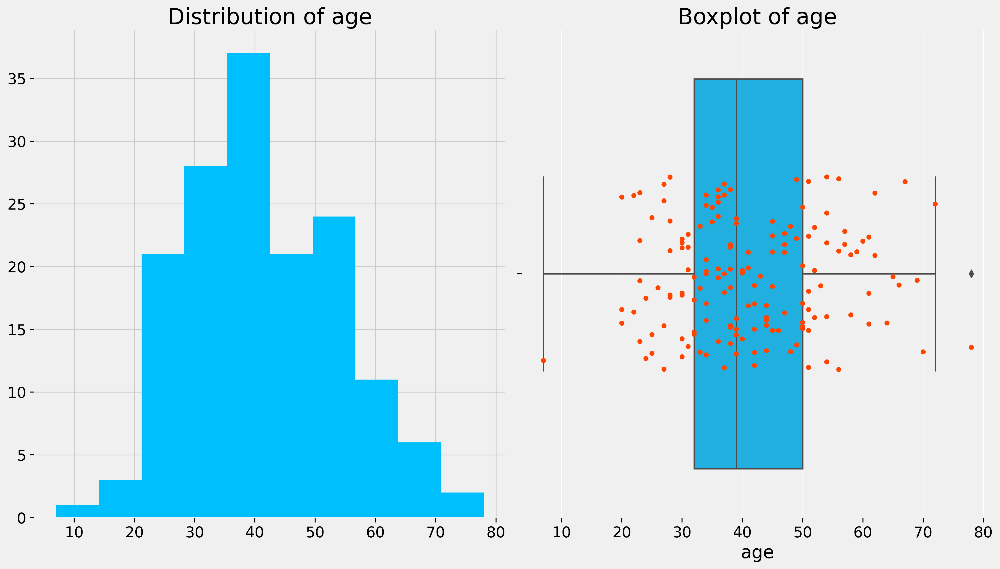

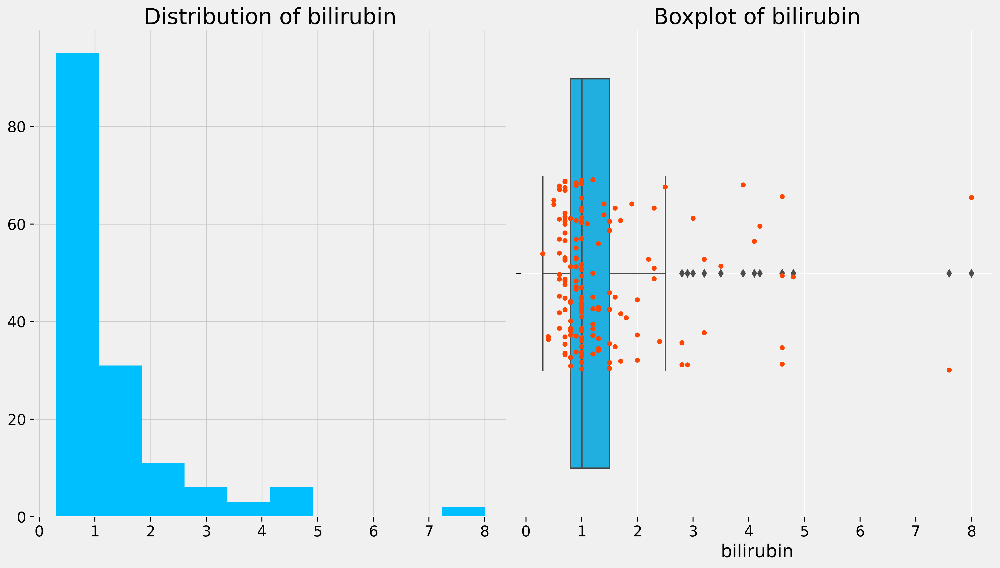

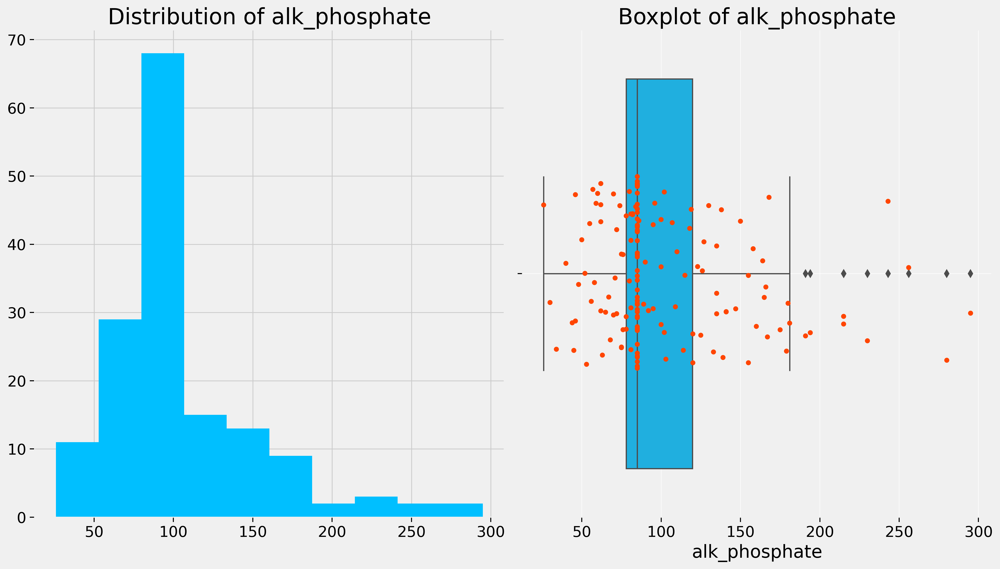

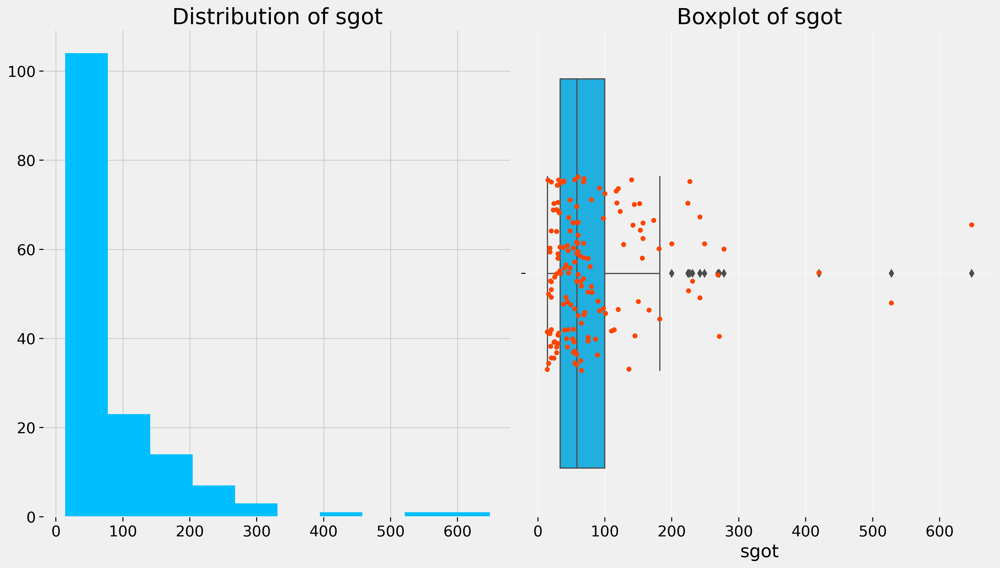

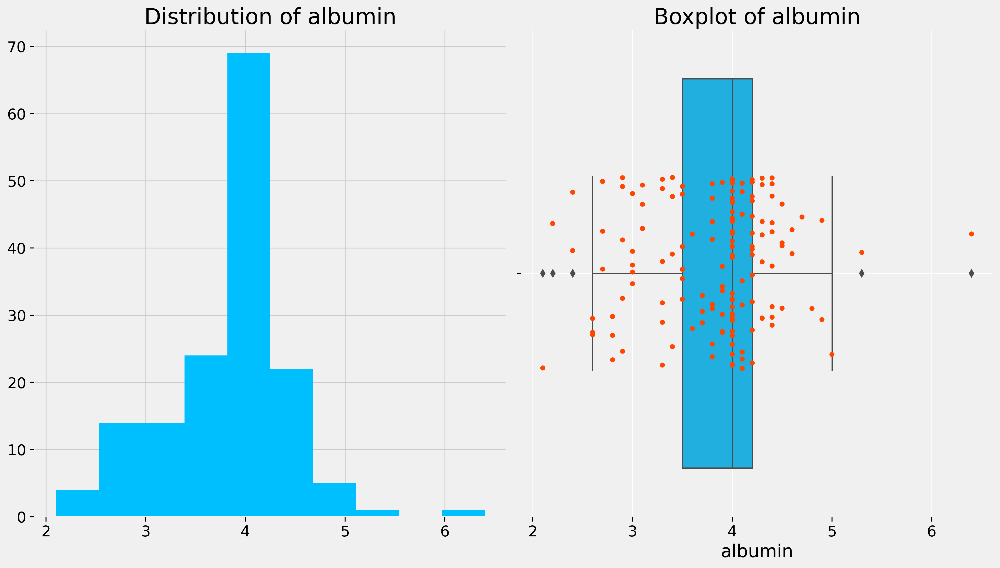

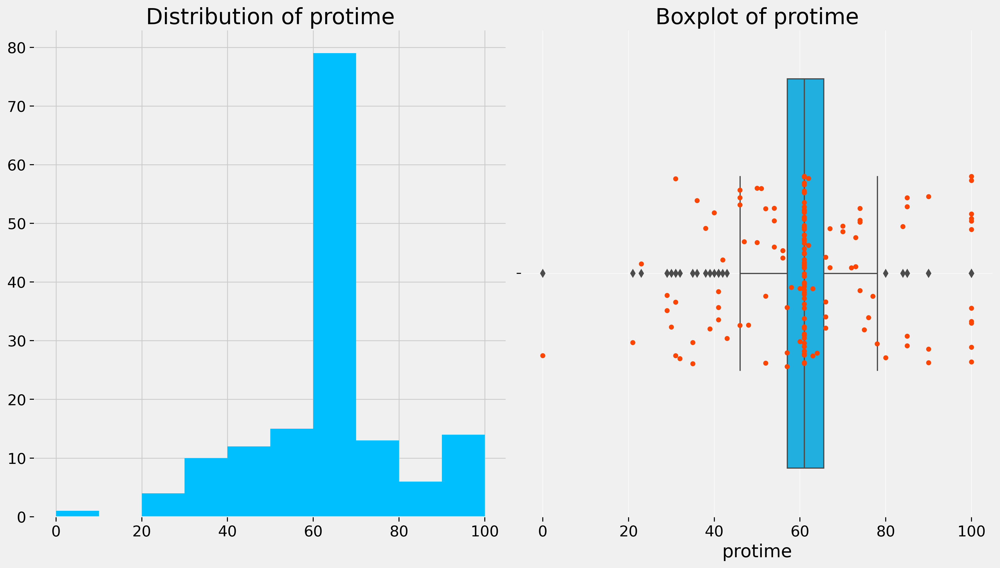

In [44]:
for i, column in enumerate(df[columns_to_check_for_outliers]):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8), dpi=300, clear=False)


    df[column].hist(bins=10, color='deepskyblue', ax=ax1)

    ax = sns.boxplot(x=column, data=df, ax=ax2, color='deepskyblue')
    ax = sns.stripplot(x=column, data=df, color="orangered", jitter=0.2, size=5.0)


    ax1.set_title('Distribution of ' + column, fontsize=22)
    ax2.set_title('Boxplot of ' + column, fontsize=22)



    plt.setp(ax1.get_xticklabels(), fontsize=15)
    plt.setp(ax1.get_yticklabels(), fontsize=15)

    plt.setp(ax2.get_xticklabels(), fontsize=15)
    ax2.set_xlabel(ax2.get_xlabel(), fontsize=18)

    plt.grid(b=True, axis='both', color='white', linewidth=0.5)

    fig.tight_layout()

    plt.savefig(f"figures/Outlier{i}.png", dpi=600, transparent=True)
    
    plt.show()

## Correlation of Dataset Features

In [45]:
# Get Correlation betwwen target variable and data features
correlation_with_target_variable = df.select_dtypes(np.number).corr()['class'].sort_values(ascending=False)
correlation_with_target_variable = pd.DataFrame(correlation_with_target_variable)

correlation_with_target_variable.to_csv('csv_tables/correlation_between_label_and_features.csv', index=True)
correlation_with_target_variable

,class
class,1.000000
ascites,0.468681
albumin,0.455537
spiders,0.387763
varices,0.361644
malaise,0.337859
protime,0.307632
fatigue,0.303624
spleen_palpable,0.233016
sex,0.168242


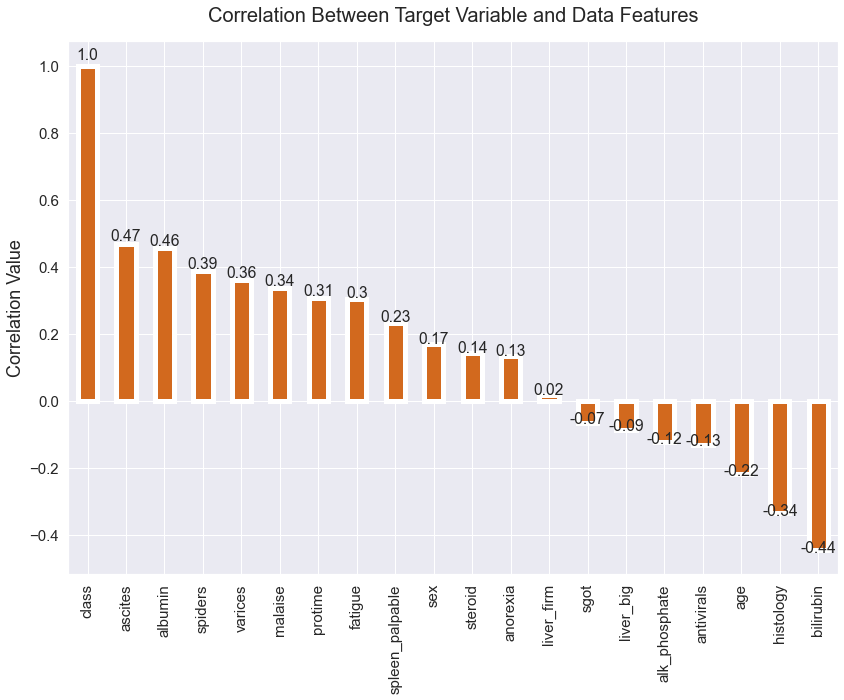

In [46]:
# Set font_scale
sns.set(font_scale=1.3)

# Plot correlation between Target Variable and Data Features
ax = correlation_with_target_variable.plot(
        kind='bar',
        figsize=(12, 10),
        rot=90, 
        color=['chocolate'], 
        edgecolor='white', 
        linewidth=5,
        legend=False,
)

plt.title('Correlation Between Target Variable and Data Features', fontsize=20, pad=20)

plt.ylabel('Correlation Value', fontsize=18)

for patch in ax.patches:
    width = patch.get_width()
    height = patch.get_height()
    x, y = patch.get_xy()
    ax.annotate(f'{round(height, 2)}', (x + width/2, y + height*1.02), ha='center')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.tight_layout()

plt.savefig(f'figures/correlation_between_label_and_features.png', dpi=600, transparent=True)
plt.show()

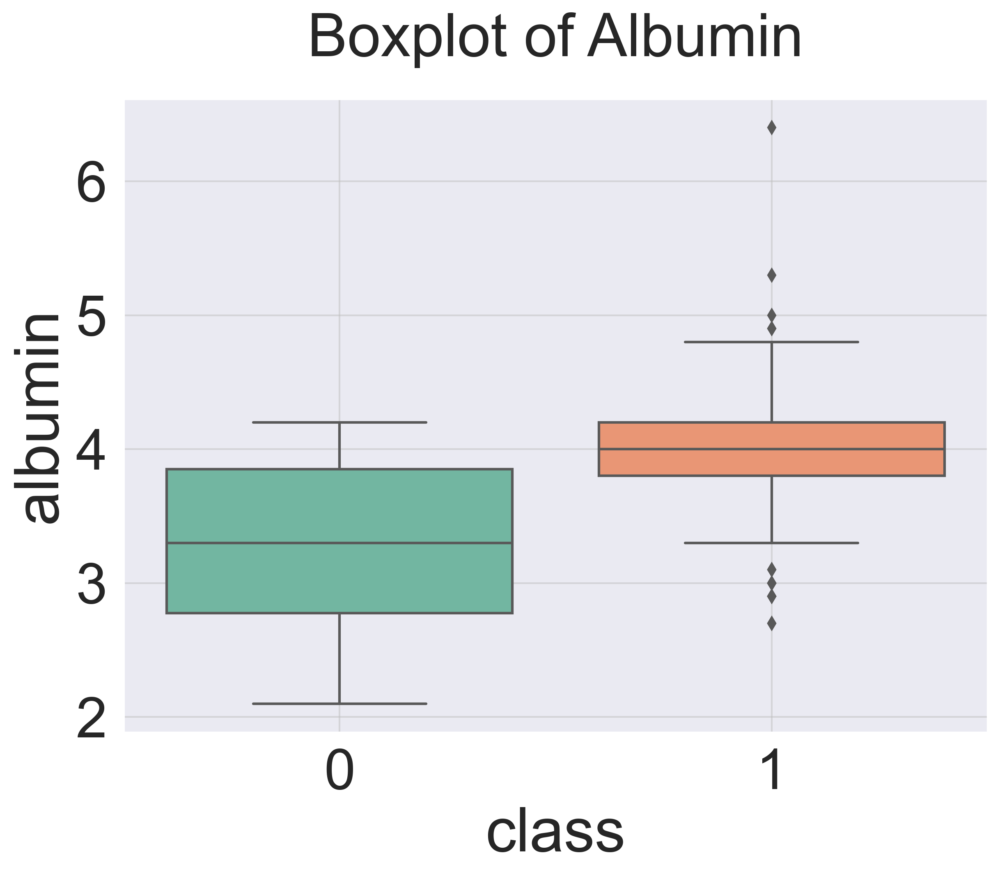

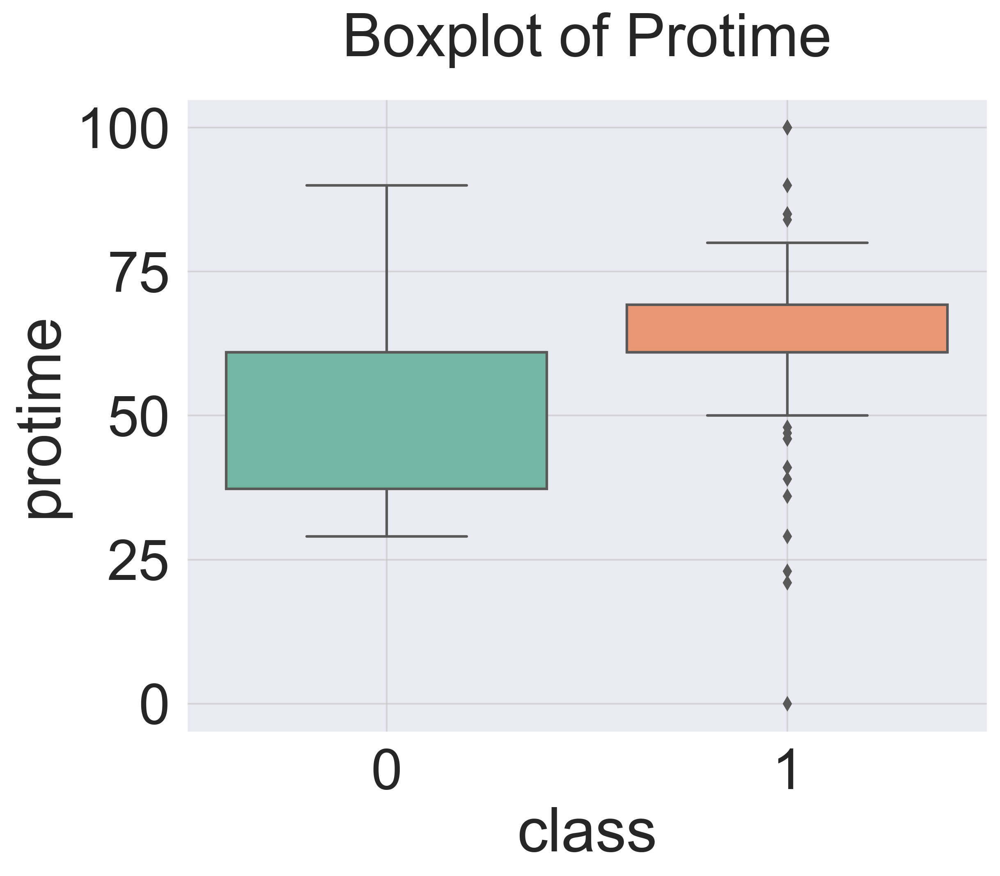

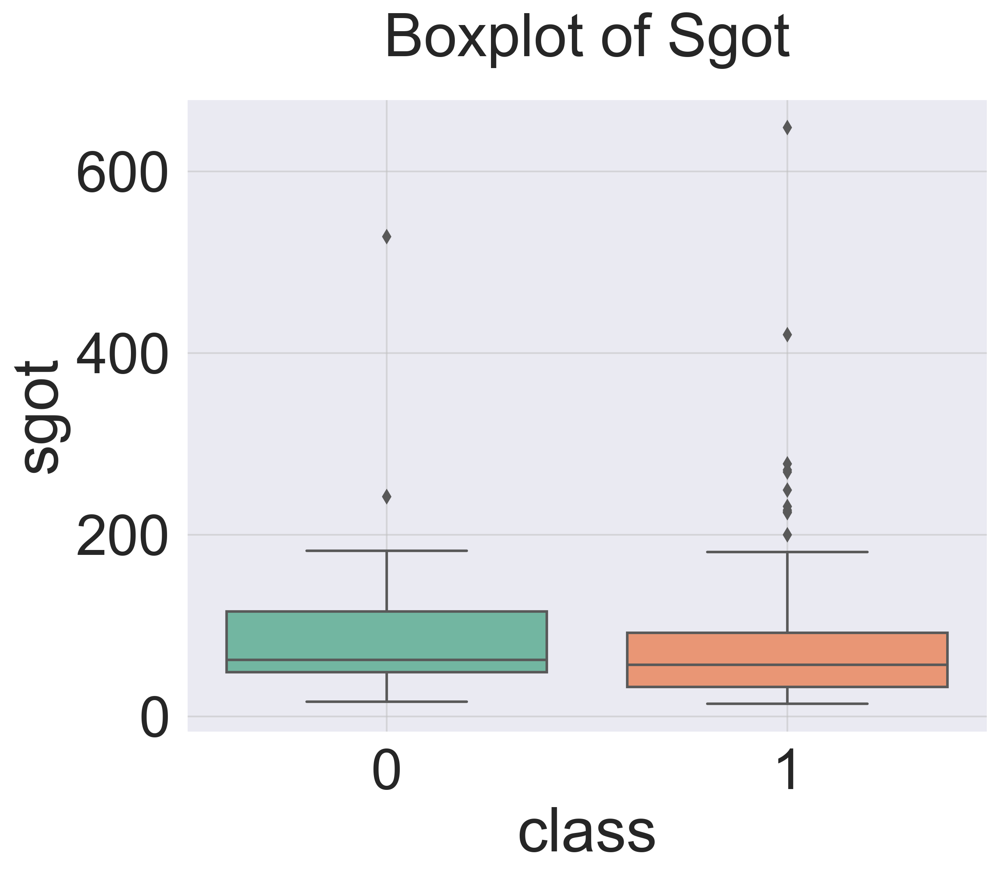

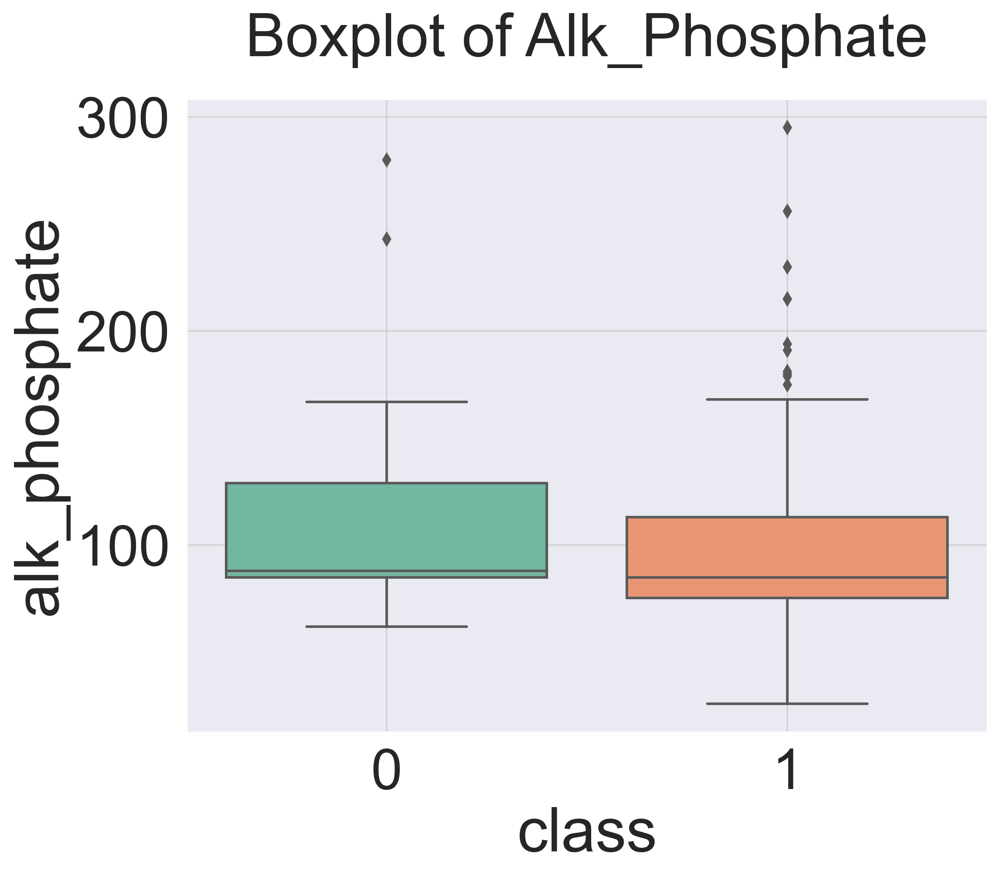

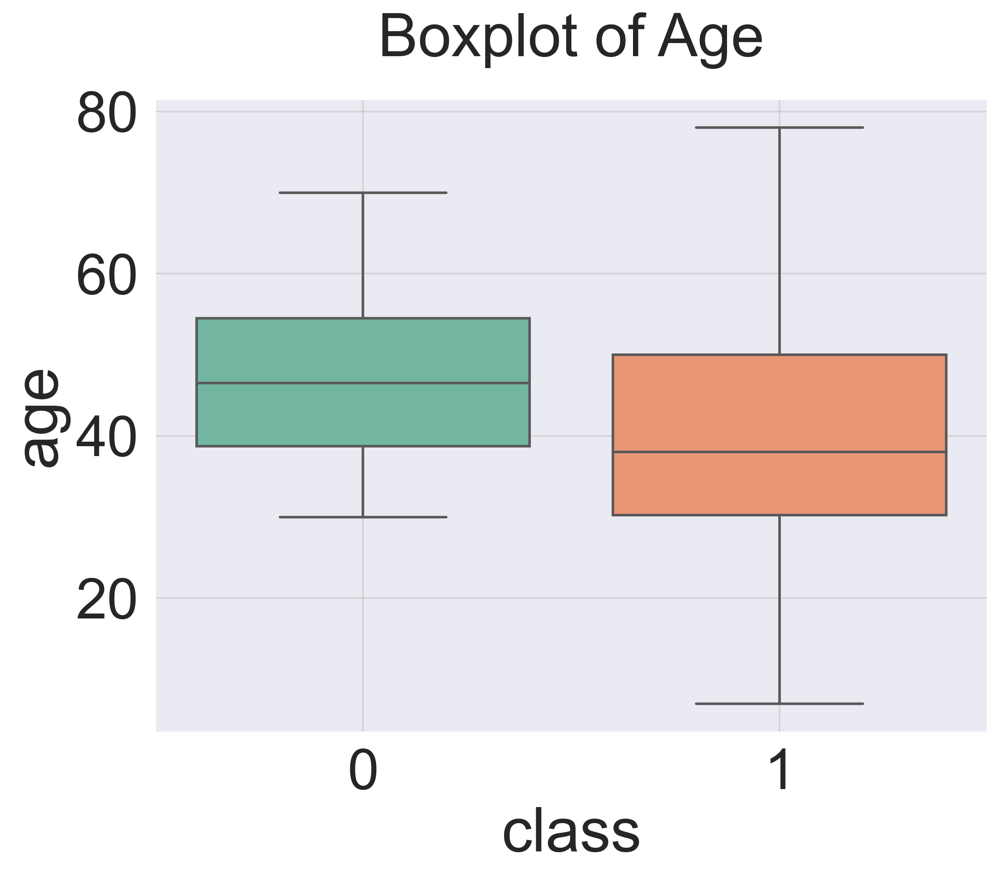

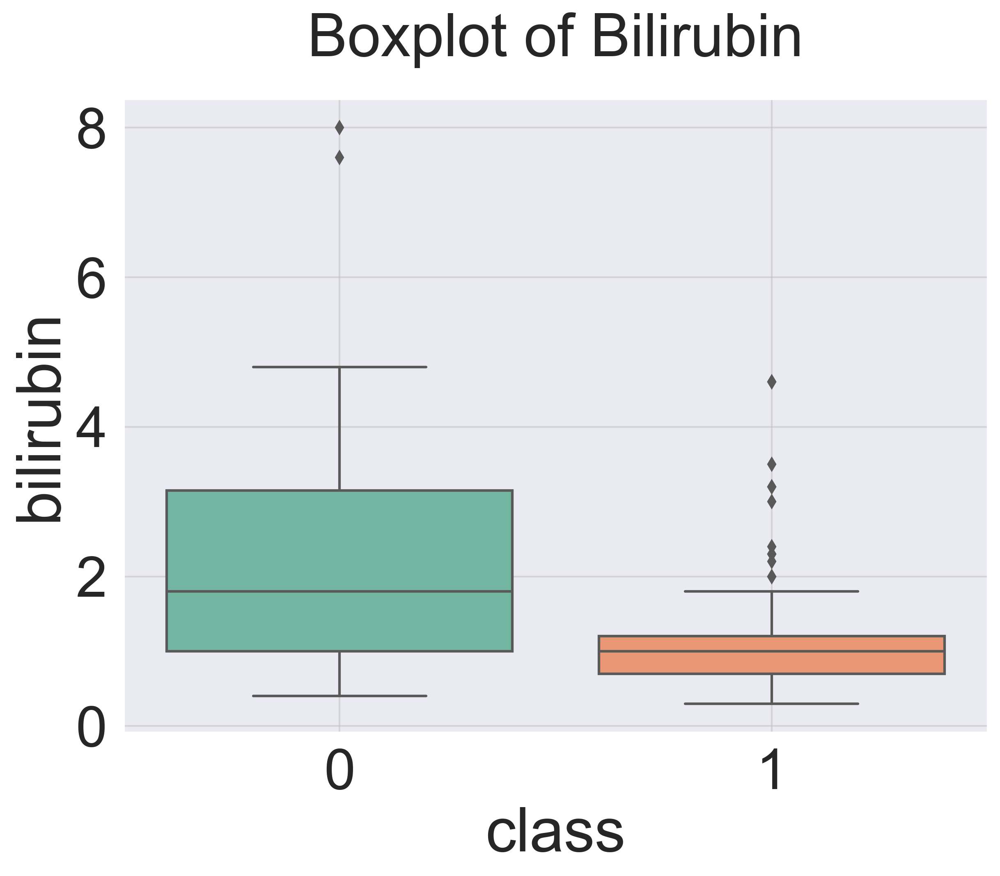

In [47]:
# Set font_scale
sns.set(font_scale=3)

# Boxplot distribution between features and target variable
correlation_features_with_continuous_values = ['albumin', 'protime', 'sgot', 'alk_phosphate', 'age', 'bilirubin']

for correlation_feature in correlation_features_with_continuous_values:
    
    plt.figure(figsize=(9, 8), dpi=300)
    
    sns.boxplot(
        x='class', 
        y=correlation_feature, 
        data=df,
        palette="Set2",
    )
    
    plt.title(f'Boxplot of {correlation_feature.title()}', fontsize=35, pad=25)

    plt.grid(b=False, alpha=0.5, color='silver')

    plt.tight_layout()

    plt.savefig(f'figures/boxplot_distribution_of_{correlation_feature}.png', dpi=600, transparent=True)
    plt.show()

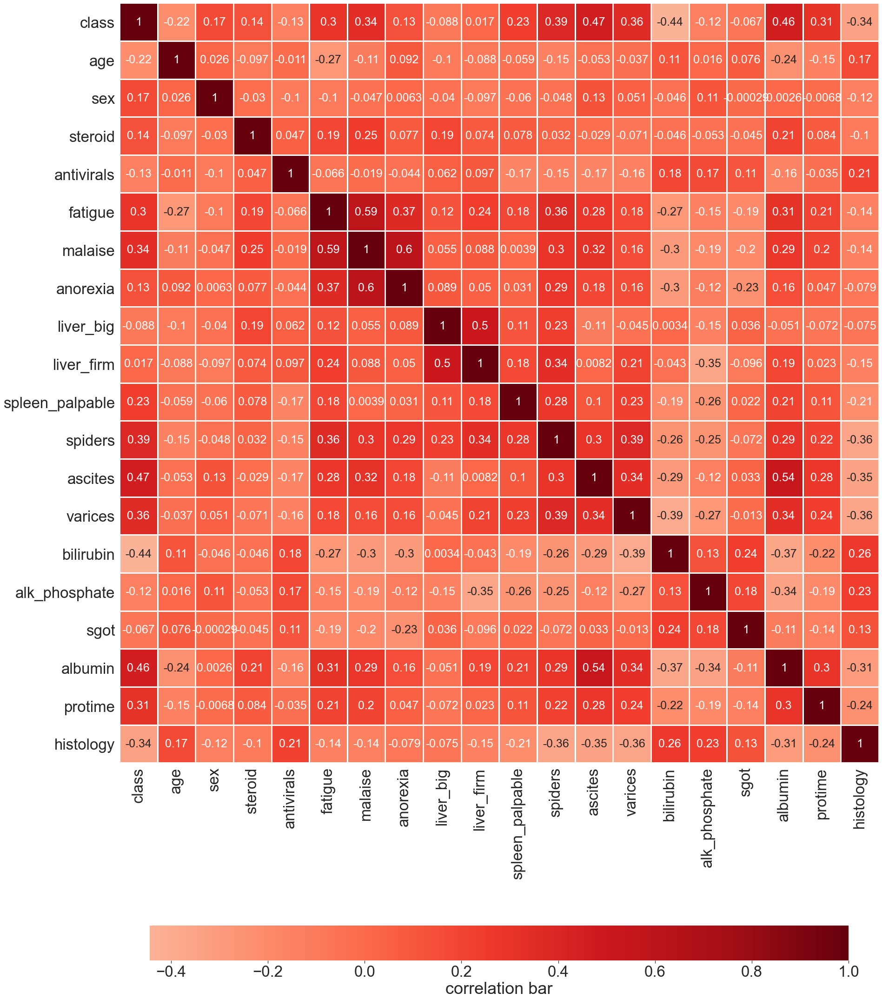

In [48]:
# Plot correlation for full dataset
correlation_data = df.select_dtypes(np.number).corr()

plt.figure(figsize=(30, 40))

sns.heatmap(
    correlation_data, 
    annot=True, 
    fmt='.2g',
    center=0,
    cmap='Reds', 
    square=True,
    annot_kws={"size": 25}, 
    cbar_kws={
        'label':'correlation bar', 
        'orientation': 'horizontal', 
        'shrink':0.8,
    },
    linewidths=3, 
    linecolor='white',
)

plt.savefig(f'figures/Data_Features_Correlation.png', dpi=300, transparent=True)

plt.show()

## Highly Positive and Highly Negative Correlated Columns

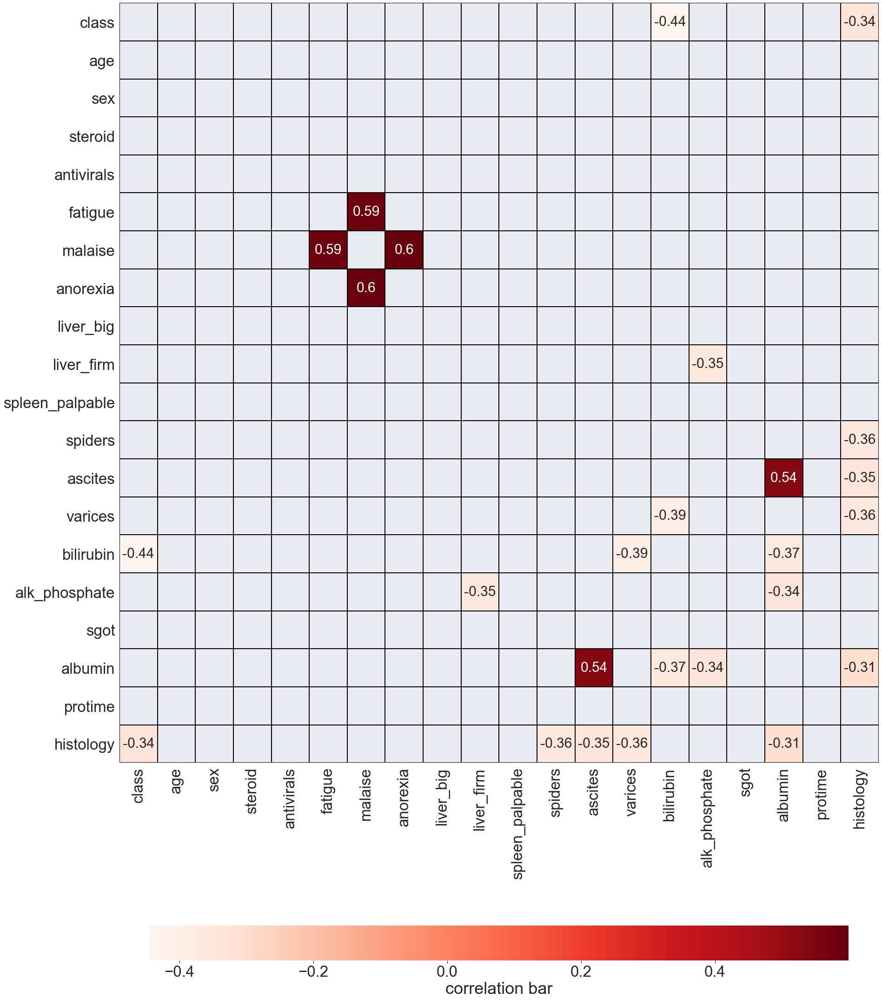

In [49]:
highly_correlated_col = df.select_dtypes(np.number).corr()

highly_correlated_col = highly_correlated_col[
    ((highly_correlated_col > 0.52) | (highly_correlated_col < -0.3))  & (highly_correlated_col != 1.0)
]

plt.figure(figsize=(30, 40))

sns.heatmap(
    highly_correlated_col, 
    annot=True, 
    cmap='Reds', 
    square=True,
    annot_kws={"size": 30}, 
    cbar_kws={
        'label':'correlation bar', 
        'orientation': 'horizontal', 
        'shrink':0.8,
    },
    linewidths=2, 
    linecolor='black',

)

plt.savefig(f'figures/highly_correlated_columns.png', dpi=300, transparent=True)

plt.show()

## Get Data Teable of Higly Correlated Columns 

In [50]:
highly_correlated_col = df.select_dtypes(np.number).corr()

highly_correlated_col = highly_correlated_col[
    ((highly_correlated_col > 0.52) | (highly_correlated_col < -0.3))  & (highly_correlated_col != 1.0)
]

highly_correlated_col_df = highly_correlated_col.unstack().sort_values().drop_duplicates().dropna()

highly_correlated_col_df = pd.DataFrame(highly_correlated_col_df)

highly_correlated_col_df.columns = ['correlation_value']

highly_correlated_col_df.to_csv('csv_tables/highly_correlated_columns.csv', index=True)

highly_correlated_col_df

correlation_value
class      bilirubin              -0.444414
bilirubin  varices                -0.391330
           albumin                -0.370158
varices    histology              -0.357936
histology  spiders                -0.355185
liver_firm alk_phosphate          -0.354005
ascites    histology              -0.345619
histology  class                  -0.336033
albumin    alk_phosphate          -0.335864
           histology              -0.306571
ascites    albumin                 0.536680
malaise    fatigue                 0.586679
anorexia   malaise                 0.599647

## Relationship between `bilirubin` and `class`

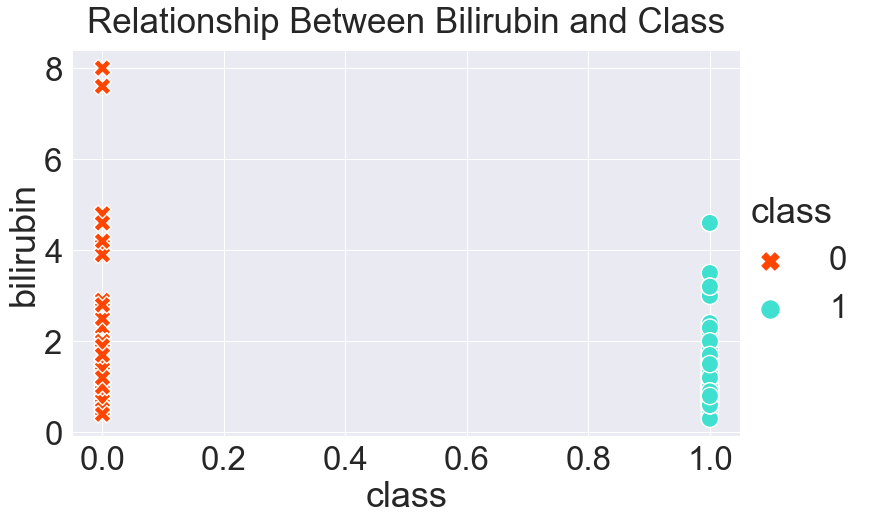

In [51]:
# plt.figure(figsize=(25, 10))

hue_colors = {
    0: 'orangered', 
    1: 'turquoise',
}

markers = {
    0: 'X',
    1: 'o',
}

sns.relplot(
    x='class', 
    y='bilirubin', 
    data=df, 
    hue='class',
    size='class',
    sizes=(300, 300),
    style='class',
#     col='class',
    markers=markers,
    palette=hue_colors,
    height=7,
    aspect=1.5,
    
);

plt.title('Relationship Between Bilirubin and Class', fontsize=35, pad=18)

plt.savefig(f'figures/relationship_between_bilirubin_and_class.png', dpi=600, transparent=True)

plt.show()

## Distribution Plot of Target Variable 

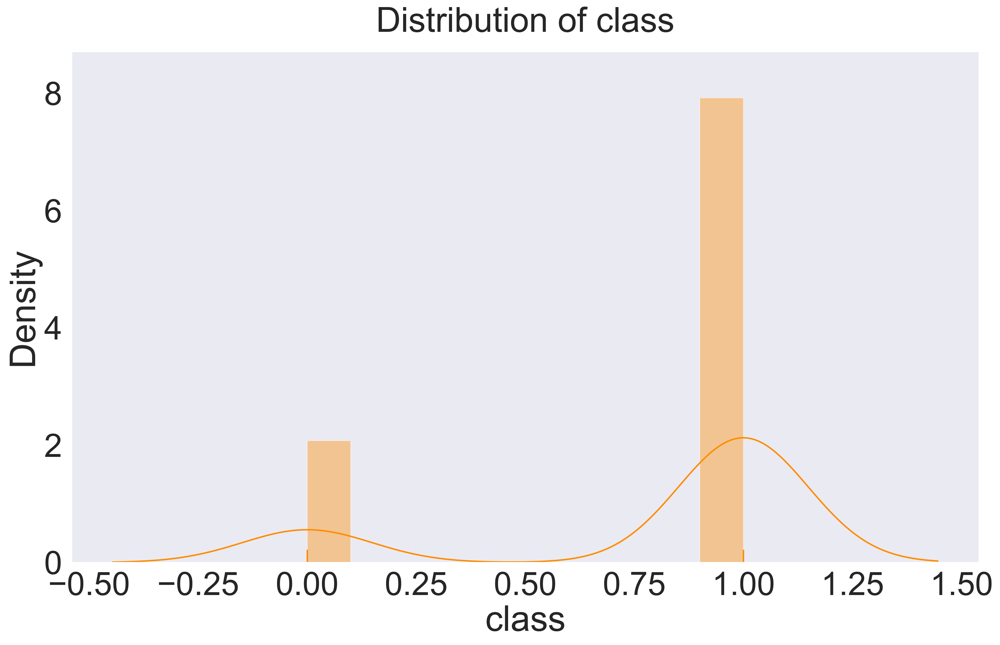

In [52]:
target_variable = 'class'

plt.figure(figsize=(15, 10), dpi=300)

sns.distplot(df[target_variable], color='darkorange', bins=10, rug=True)

plt.title(f'Distribution of {target_variable}', fontsize=35, pad=20)

plt.grid(alpha=0.6, color='grey')

plt.tight_layout()

plt.savefig(f'figures/Distribution_Plot_of_{target_variable}.png', dpi=600, transparent=True)
plt.show()

## Count Plot of Target Variable

In [53]:
def count_plot(df, column_name, color=['deepskyblue', 'dodgerblue'], edgecolor='white', dpi=300, transparent=True, path=''):

    fig = plt.figure(figsize=(10, 8), dpi=dpi)

    ax = df[column_name].value_counts().plot(
        kind='bar', 
        rot=0, 
        color=color, 
        edgecolor=edgecolor, 
        linewidth=5,
    )
    
    plt.title(column_name.title(), fontsize=35, pad=18)
    
    for patch in ax.patches:
        width = patch.get_width()
        height = patch.get_height()
        x, y = patch.get_xy()
        ax.annotate(f'{height}', (x + width/2, y + height*1.02), ha='center')
    
    top_value = df[column_name].value_counts().max() + 10
    
    plt.ylim(bottom=0, top=top_value)
    
    plt.xticks(fontsize=25)
    
    plt.yticks(fontsize=25)
    
    plt.grid(alpha=0.5, color='grey')
    
    plt.tight_layout()
    
    plt.savefig(f'{path}/{column_name}_count_plot.png', dpi=600, transparent=transparent)
    plt.show()

* ### 0 - Death
* ### 1 - Alive

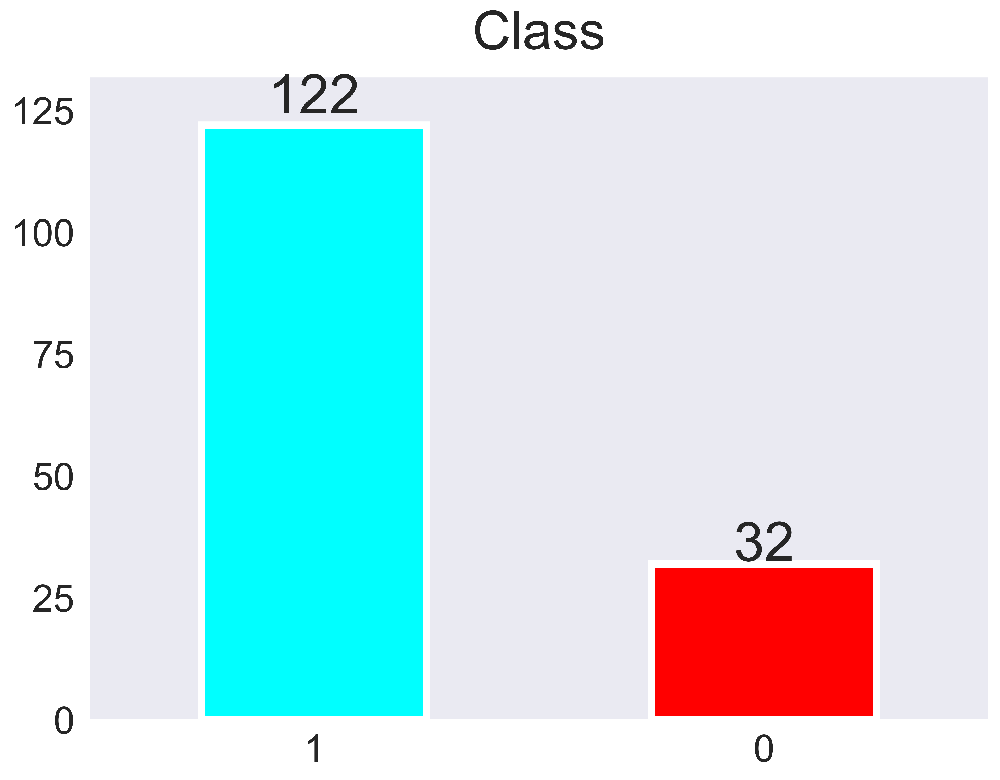

In [54]:
count_plot(
    df=df, 
    column_name=target_variable, 
    color=['cyan', 'red'],
    edgecolor='white',
    dpi=600, 
    transparent=True,
    path='figures'
)

## Pie Chart Representation of the Class Attribute

In [55]:
def draw_pie_chart(df, column_name, labels, colors=['darkturquoise', 'silver'], dpi=300, transparent=True, path=''):

    # Get number of values that belongs to the `die` class
    class_1 = len(df[df[column_name] == 0])

    # Get number of values that belongs to the `live` class
    class_2 = len(df[df[column_name] == 1])

    plt.figure(figsize=(10, 8), dpi=dpi)

    # Sizes of each class attribute
    sizes = [class_1, class_2]

    # explode 1st slice of the pie chart
    explode = (0.1, 0)  

    # Plot pie chart
    plt.pie(
        sizes, 
        explode=explode, 
        labels=labels, 
        colors=colors, 
        autopct='%1.1f%%', 
        shadow=False, 
        startangle=90,
        wedgeprops={'linewidth': 3, 'width': 1, 'edgecolor': 'white'},
        textprops={'fontsize': 24},
    )
    
    center_circle = plt.Circle(
        (0, 0), 
        0.50, 
        fc='white'
    )
    fig = plt.gcf()
    fig.gca().add_artist(center_circle)
    
    plt.title(column_name.upper(), fontsize=25)

    # Set axis to equal
    plt.axis('equal')
    
    plt.tight_layout()

    # Save pie chart
    plt.savefig(f'{path}/pie_chart_of_{column_name}.png', dpi=600, transparent=transparent)

    # Show pie chart
    plt.show()

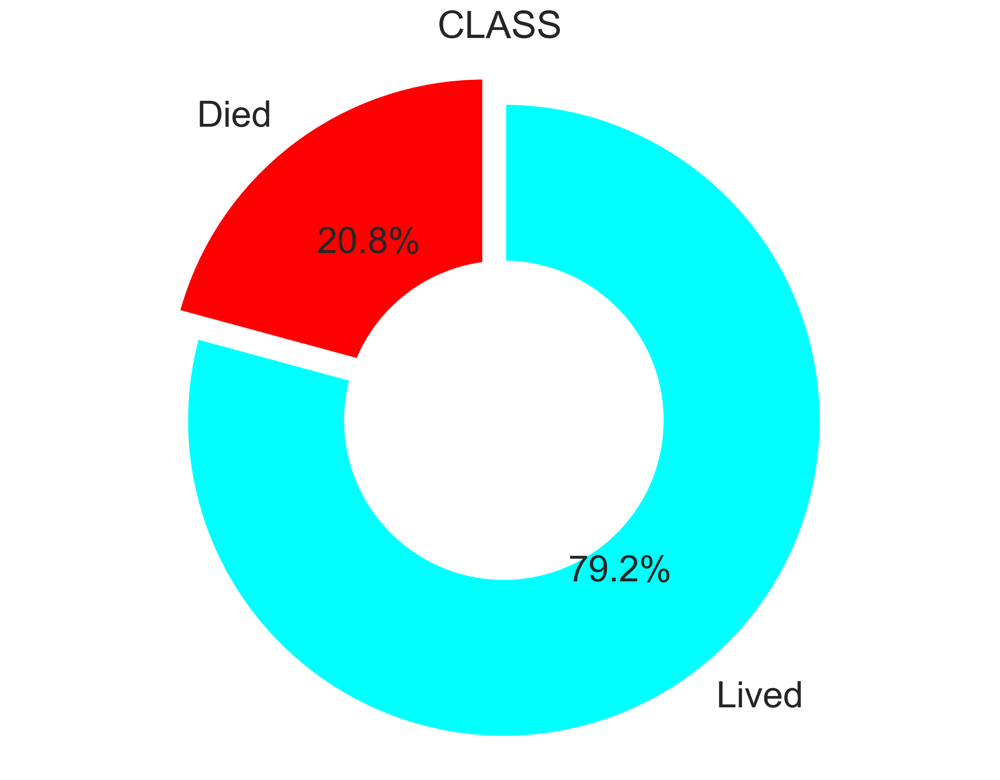

In [56]:
draw_pie_chart(
    df=df,
    column_name='class', 
    labels=['Died', 'Lived'], 
    colors=['red', 'cyan'], 
    dpi=300, 
    transparent=True,
    path='figures',
)

### Target Variable is Higly imbalance
---

## Get Age Distribution

In [57]:
labels = [
    "Less than 10",
    "10-20",
    "20-30",
    "30-40",
    "40-50",
    "50-60",
    "60-70",
    "70 and more"
]

bins = [0, 10, 20, 30, 40, 50, 60, 70, 80]

frequency_df = df.groupby(pd.cut(df['age'], bins=bins, labels=labels)).size()

frequency_df = frequency_df.reset_index(name='count')

frequency_df.to_csv("csv_tables/frequency_distribution_of_age.csv", index=False)

frequency_df

,age,count
0,Less than 10,1
1,10-20,3
2,20-30,28
3,30-40,50
4,40-50,35
5,50-60,24
6,60-70,11
7,70 and more,2


## Plot Age Distribution

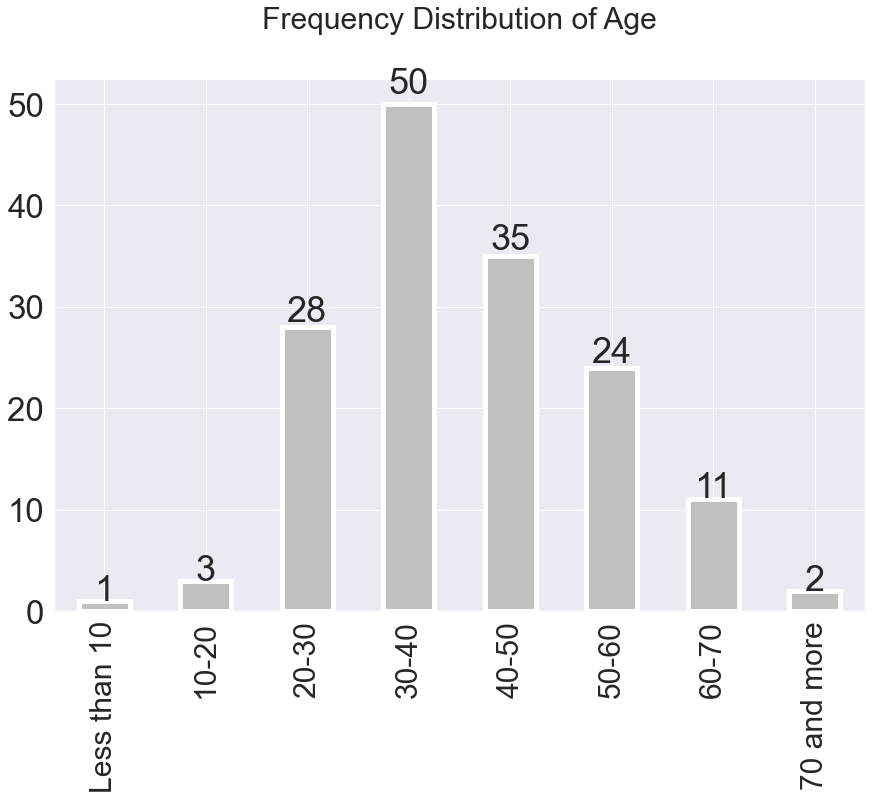

In [58]:
ax = frequency_df.plot(
    kind='bar', 
    figsize=(13, 12),
    rot=90, 
    color=['silver'], 
    edgecolor='white', 
    linewidth=5,
    legend=False
)


plt.title('Frequency Distribution of Age', fontsize=30, pad=50)

plt.xticks(ticks=np.arange(len(frequency_df)), labels=frequency_df['age'], fontsize=30)

for patch in ax.patches:
    width = patch.get_width()
    height = patch.get_height()
    x, y = patch.get_xy()
    ax.annotate(f'{round(height, 3)}', (x + width/2, y + height*1.02), ha='center')


plt.tight_layout()

plt.savefig(f'figures/frequency_distribution_of_age.png', dpi=600, transparent=True)
plt.show()

## Count Plot of `SEX` Column Head

* ### 0 - Male
* ### 1 - Female

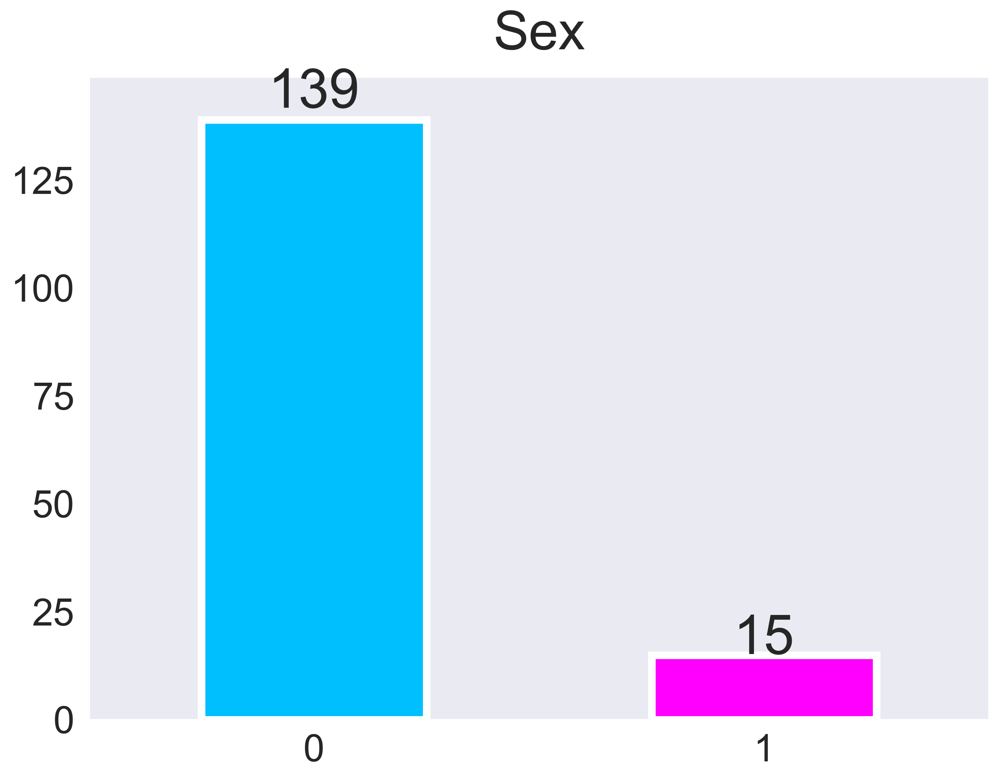

In [59]:
count_plot(
    df=df, 
    column_name='sex', 
    color=['deepskyblue', 'magenta'],
    edgecolor='white',
    dpi=300, 
    transparent=True,
    path='figures',
)

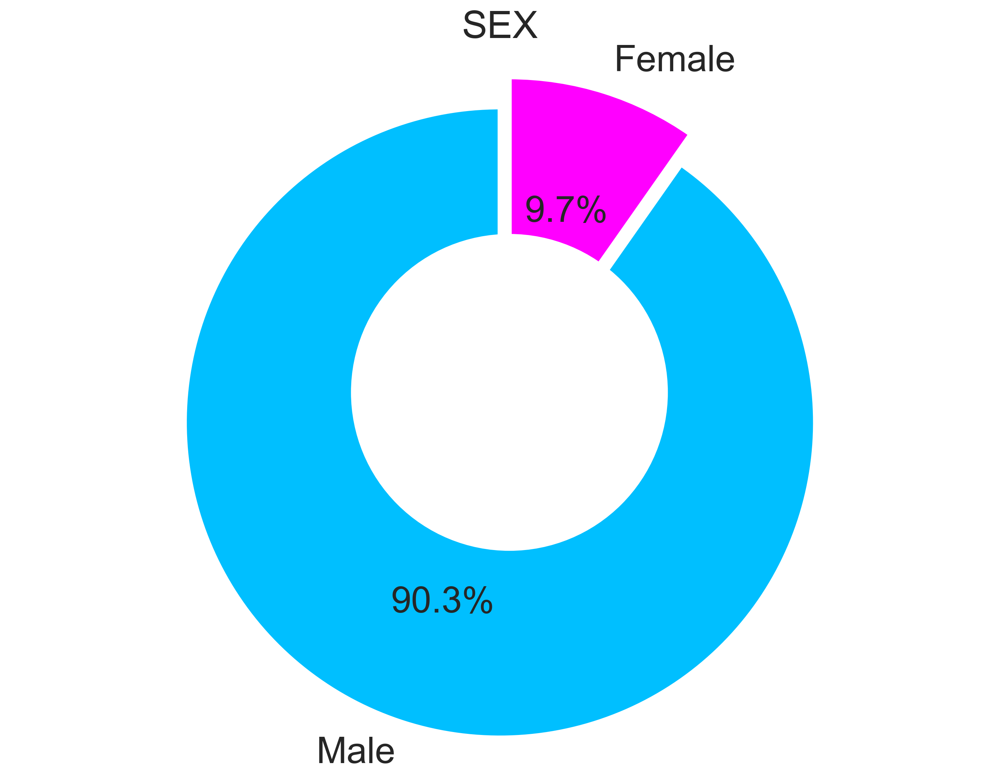

In [60]:
draw_pie_chart(
    df=df,
    column_name='sex', 
    labels=['Male', 'Female'], 
    colors=['deepskyblue', 'magenta'],
    dpi=300, 
    transparent=True,
    path='figures',
)

### There are `139 (90.3%) Males` and `15 (9.7%) Females`
- #### This Data Feature is certainly going to introduce bias. It will predict more males to live.

## Drop `SEX` Data Feature

In [61]:
df.drop('sex', inplace=True, axis=1)
df.head()

,class,age,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,1,50,0,1,0,1,1,0,1,1,1,1,1,0.9,135,42,3.5,61,0
1,1,78,1,1,0,1,1,1,1,1,1,1,1,0.7,96,32,4.0,61,0
2,1,31,1,0,1,1,1,1,1,1,1,1,1,0.7,46,52,4.0,80,0
3,1,34,1,1,1,1,1,1,1,1,1,1,1,1.0,85,200,4.0,61,0
4,1,34,1,1,1,1,1,1,1,1,1,1,1,0.9,95,28,4.0,75,0


## Bar Plot of the Various `Bianry (Yes/No)` Attributes

In [62]:
binary_columns = [
    'steroid', 
    'antivirals', 
    'fatigue', 
    'malaise', 
    'anorexia', 
    'liver_big', 
    'liver_firm', 
    'spleen_palpable', 
    'spiders', 
    'ascites', 
    'varices', 
    'histology',
]

labels = ['No', 'Yes']

colors = [
    ['lime', 'orangered'],
    ['orange', 'lightgreen'],
    ['skyblue', 'yellowgreen'],
    ['orange', 'lightgreen'],
    ['orange', 'deepskyblue'],
    ['chocolate', 'orange'],
    ['orange', 'chocolate'],
    ['darkturquoise', 'silver'],
    ['limegreen', 'orange'],
    ['deepskyblue', 'orange'],
    ['darkorange', 'skyblue'],
    ['orangered', 'turquoise']
]

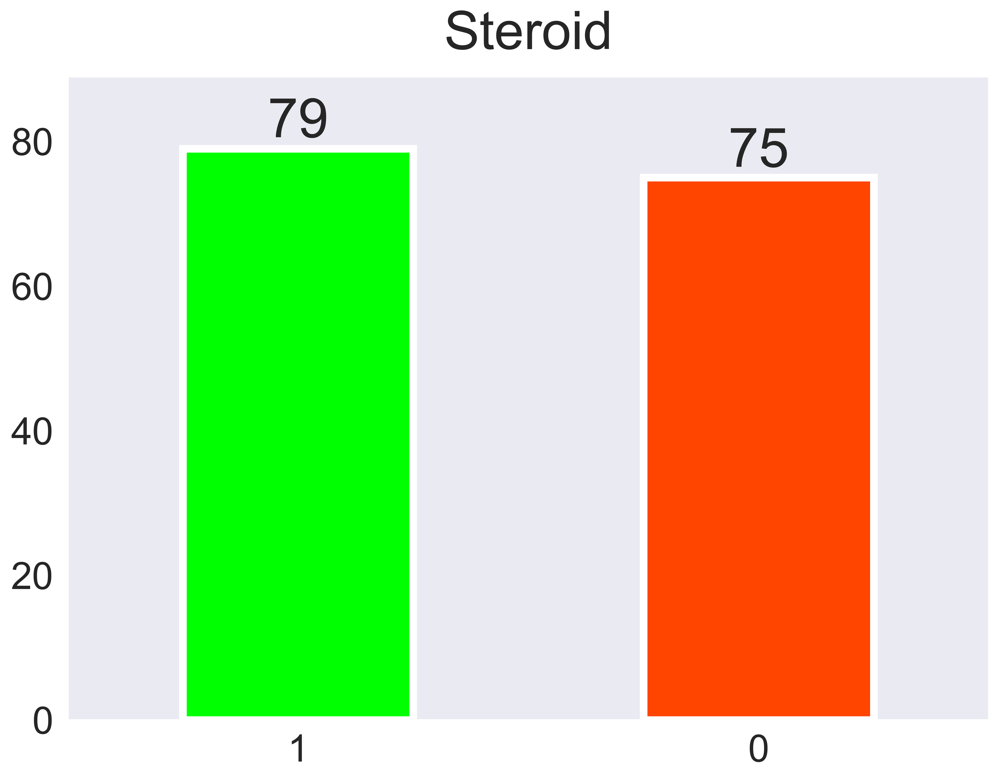

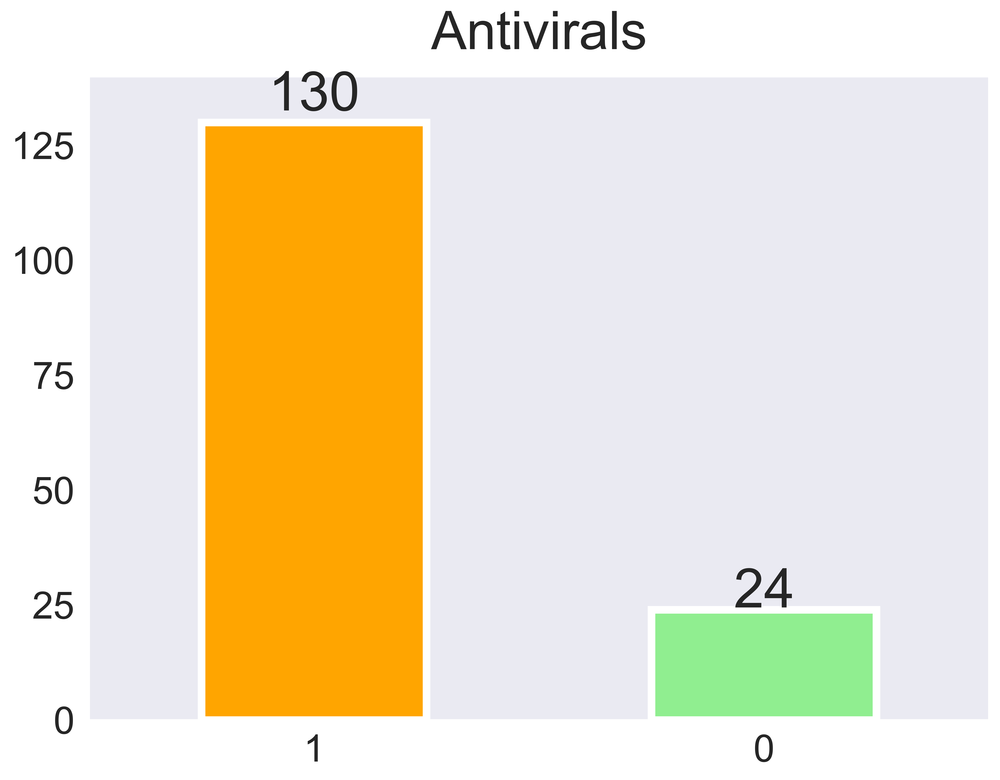

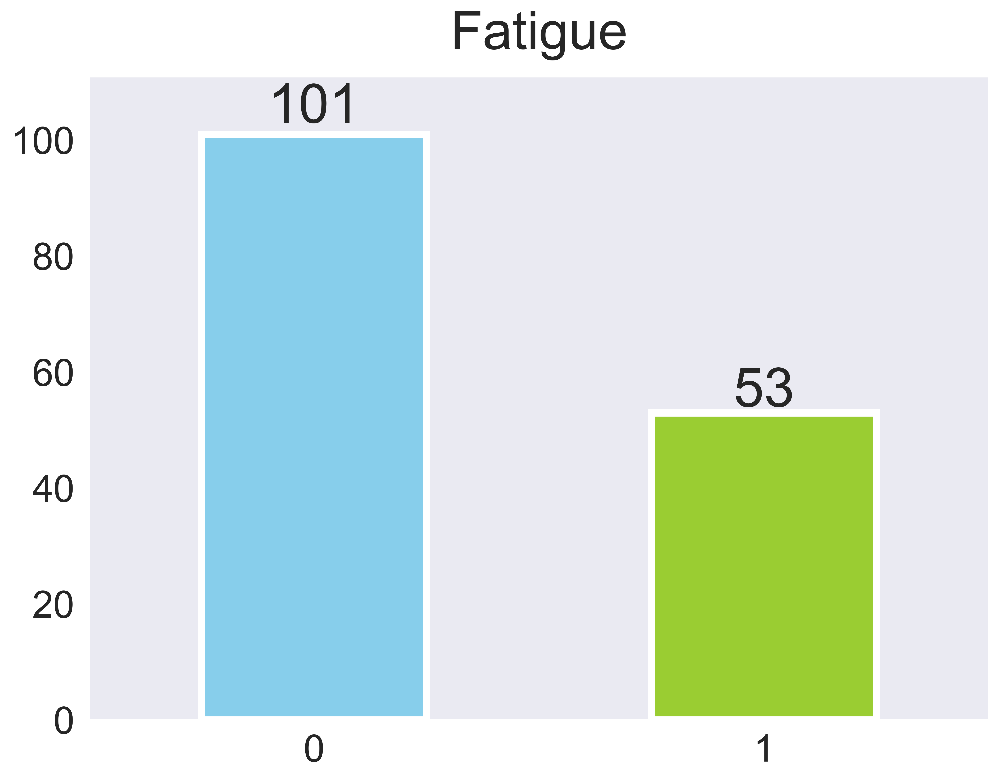

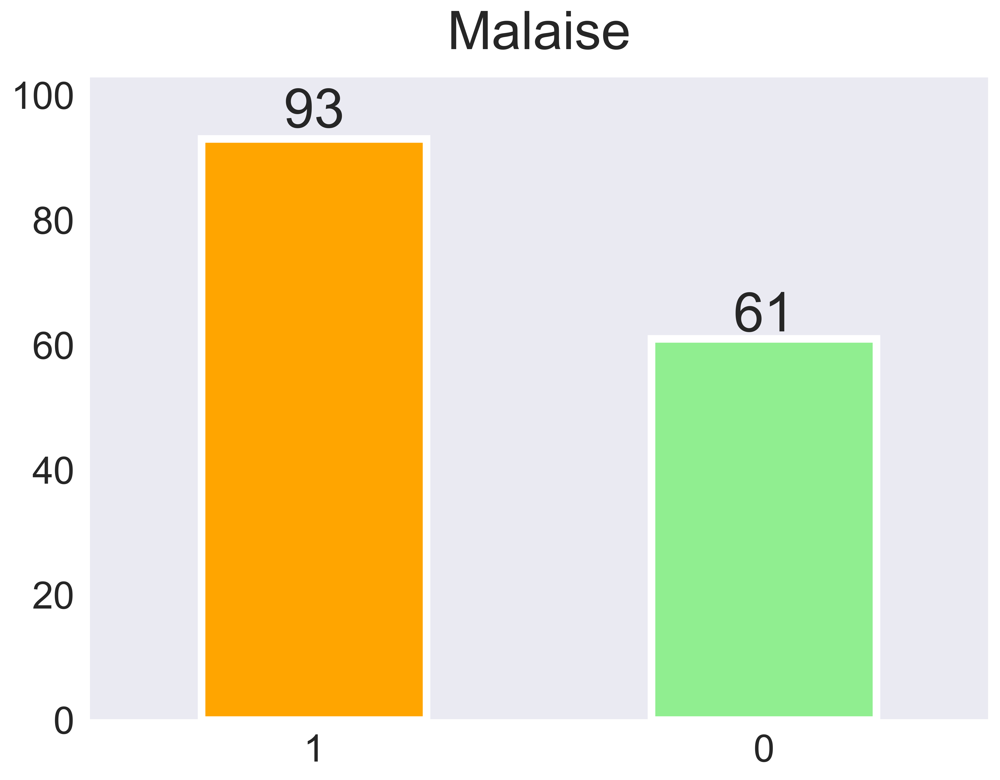

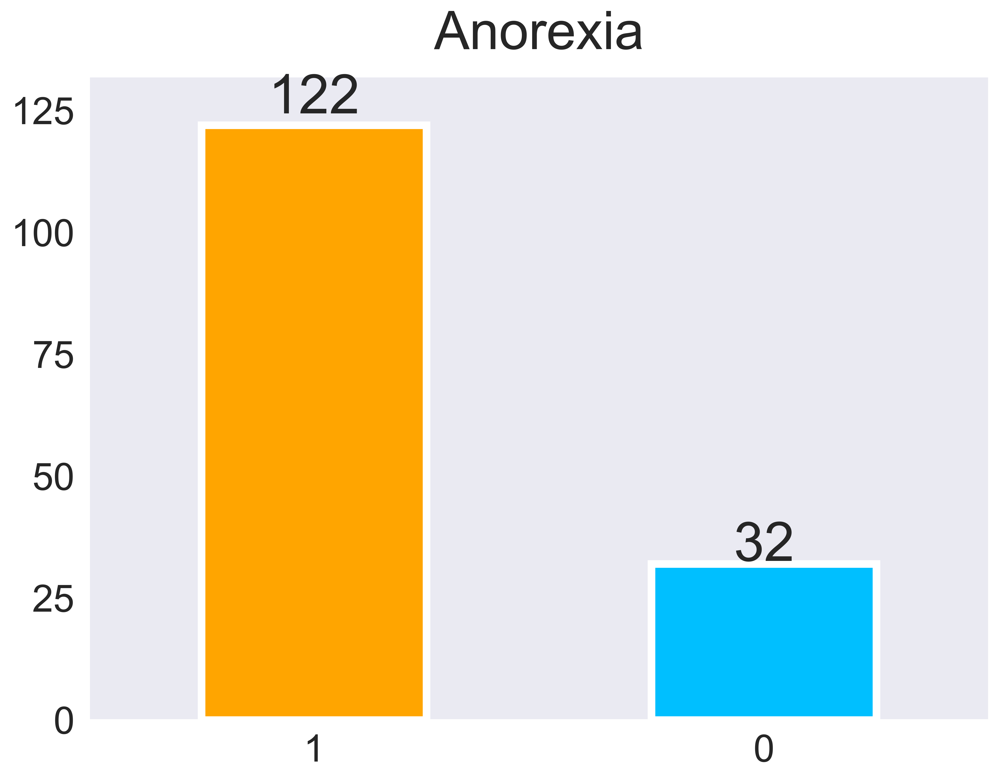

...

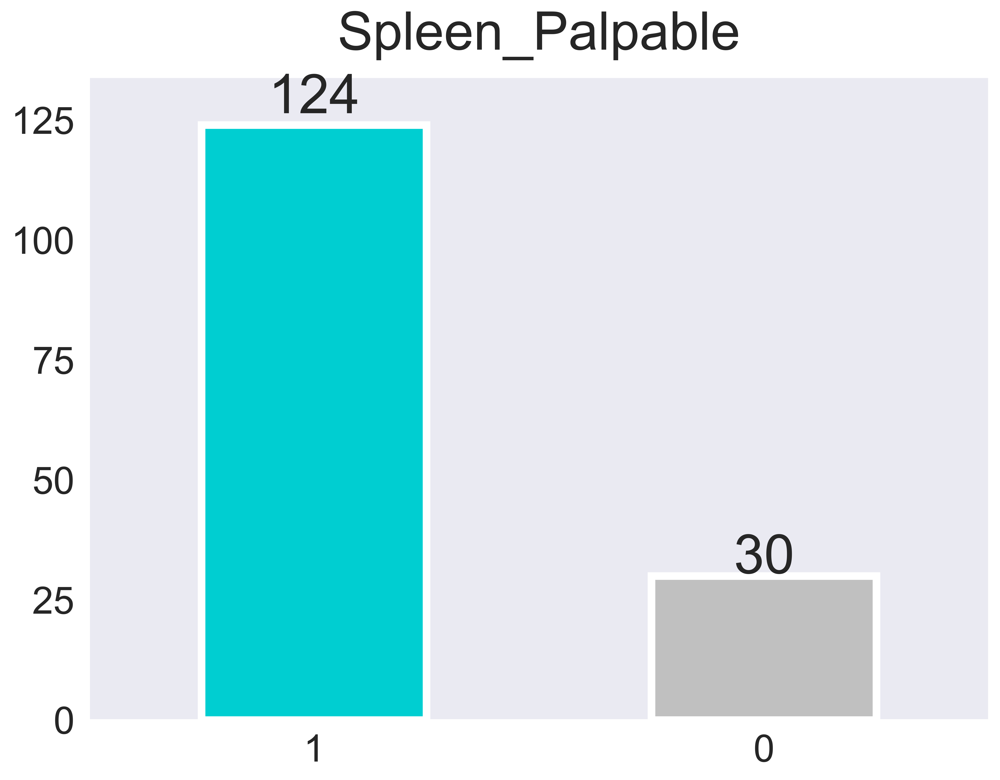

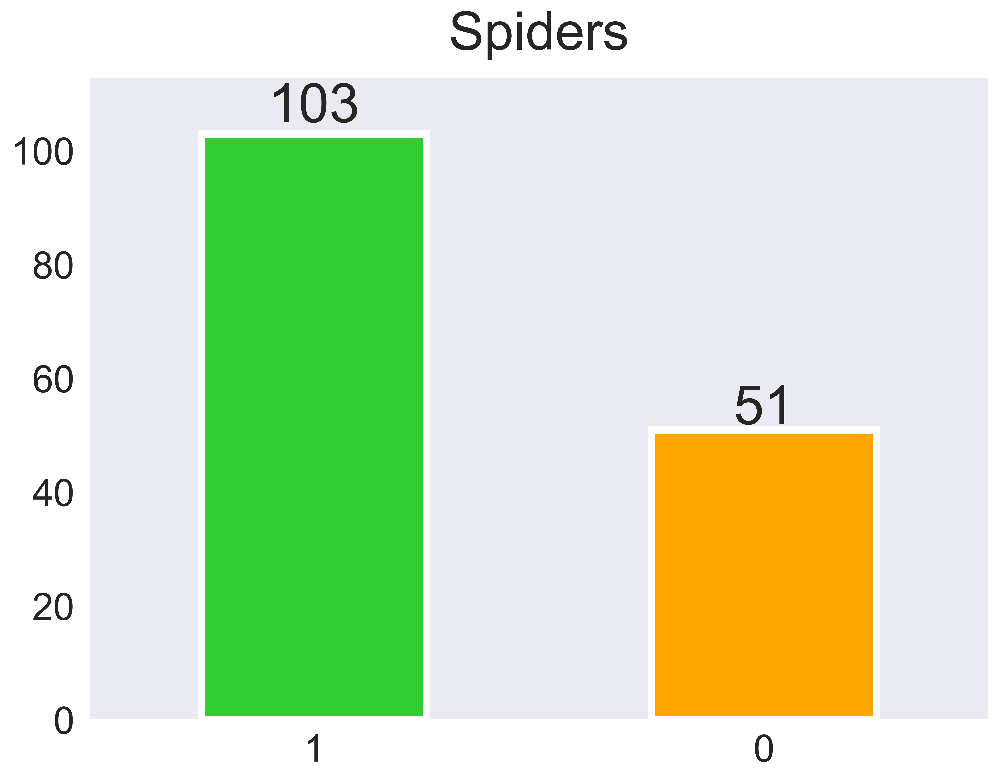

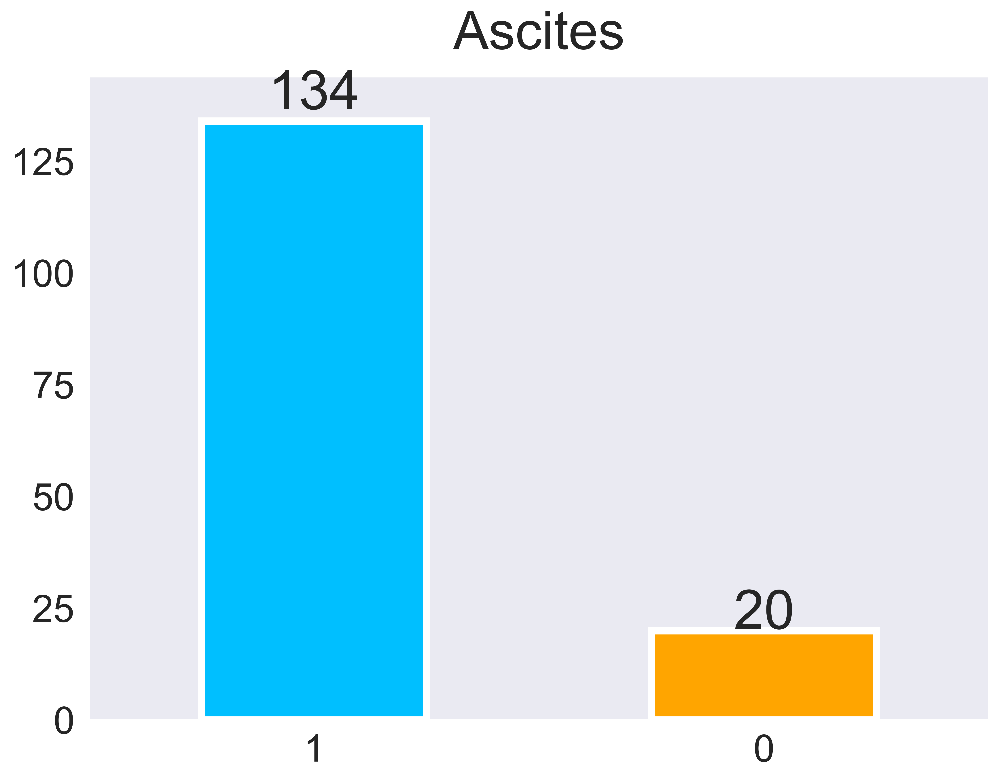

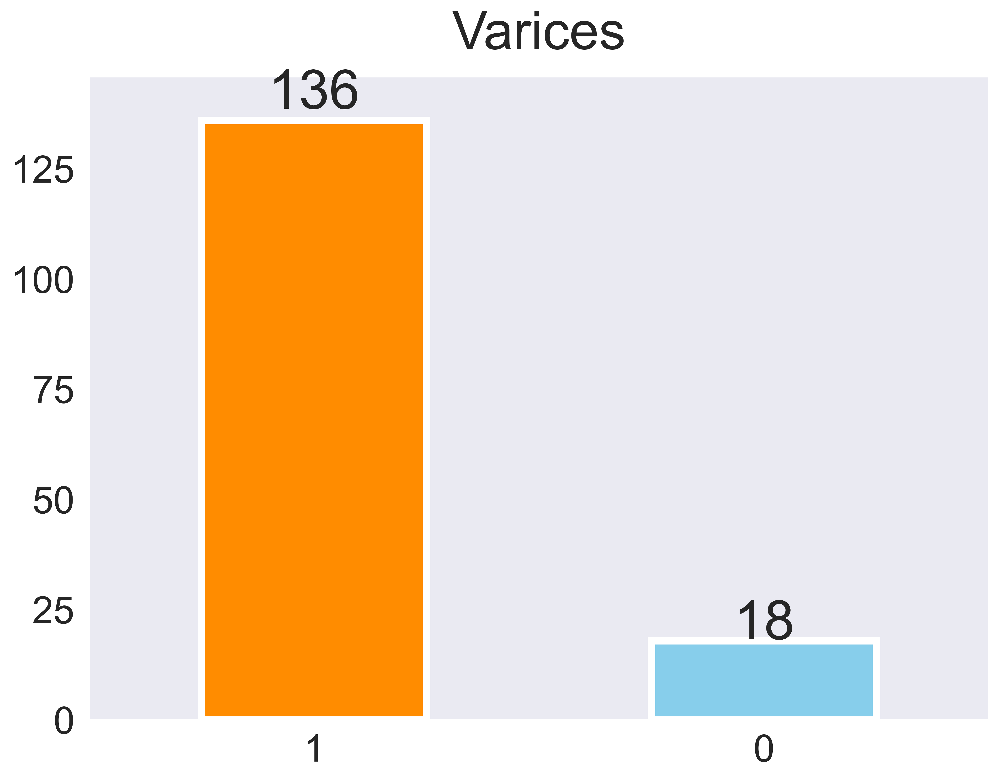

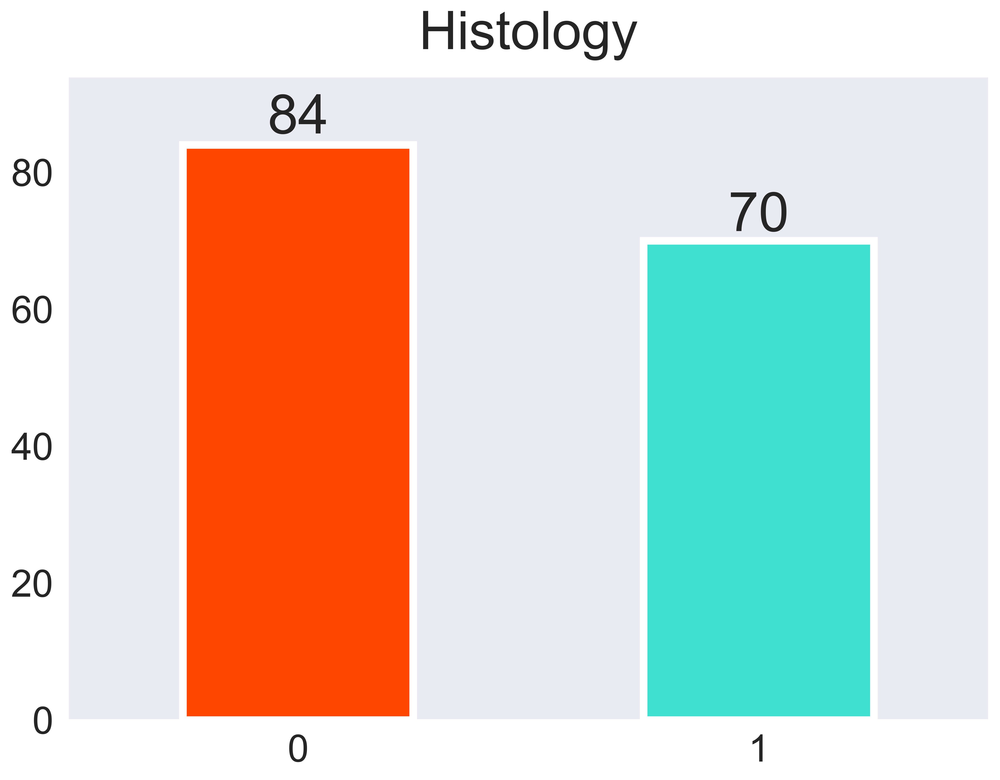

In [63]:
for i in range(len(binary_columns)):
    count_plot(
    df=df, 
    column_name=binary_columns[i], 
    color=colors[i],
    edgecolor='white',
    dpi=600, 
    transparent=True,
    path='figures'
)

## Pie Chart Representation of the Various `Bianry (Yes/No)` Attributes

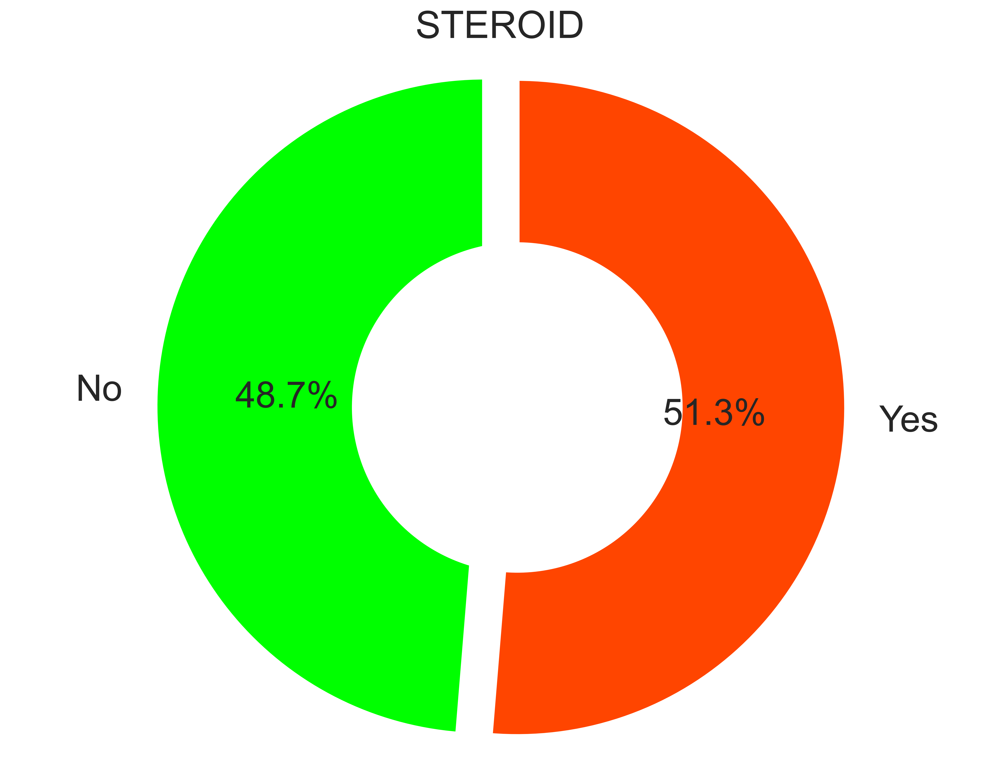

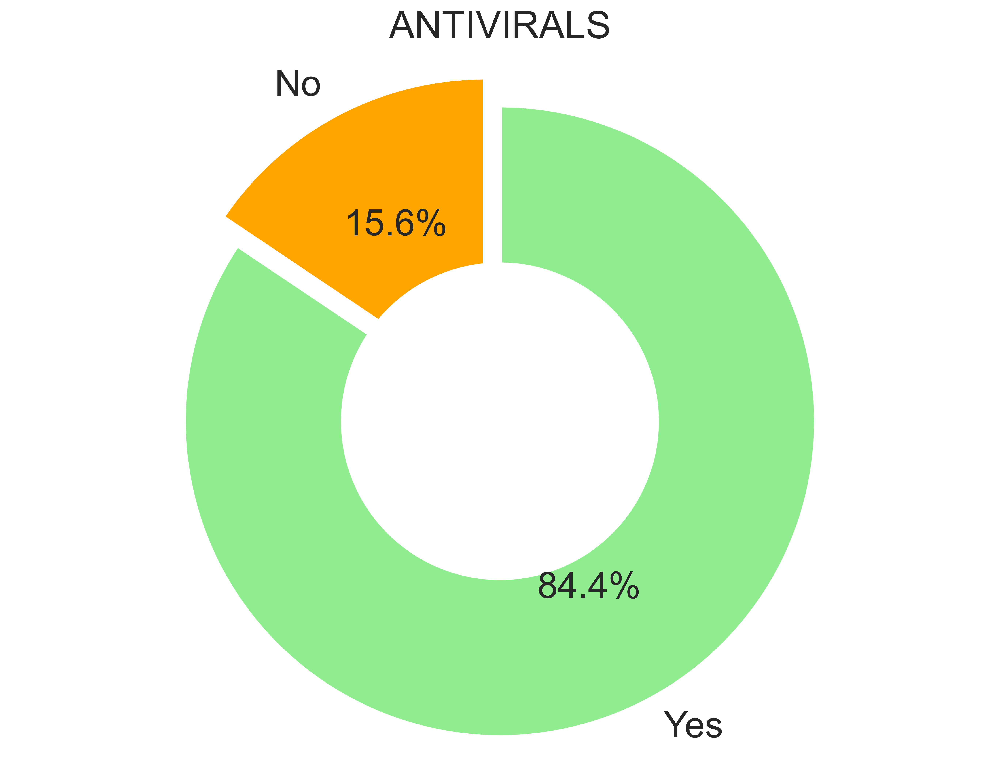

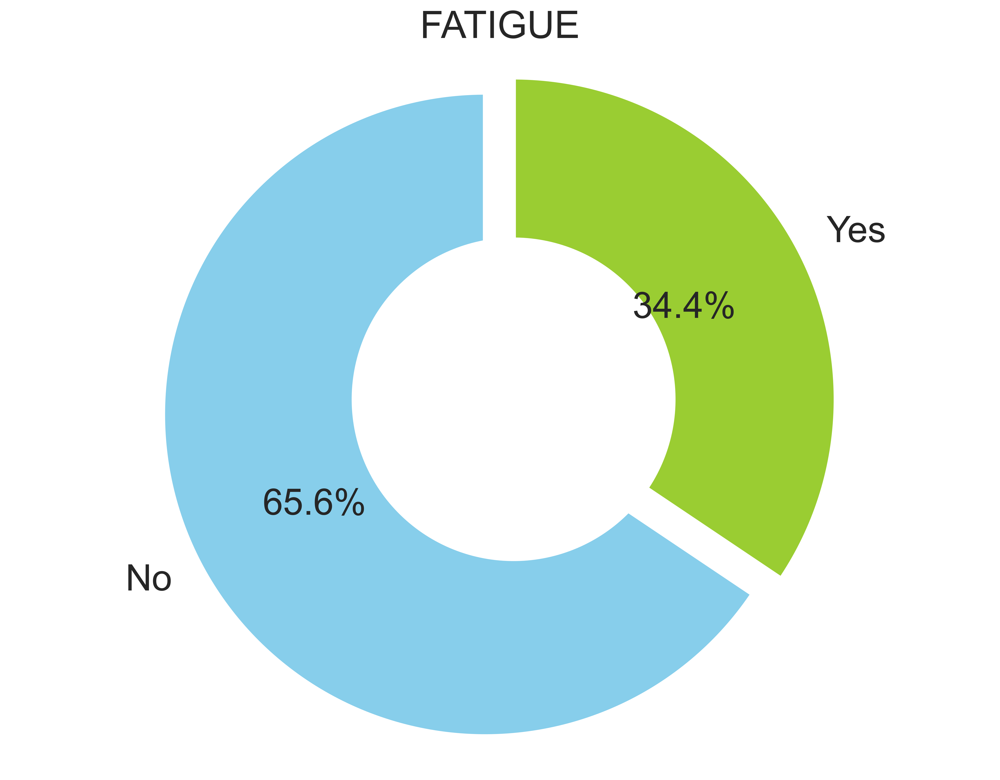

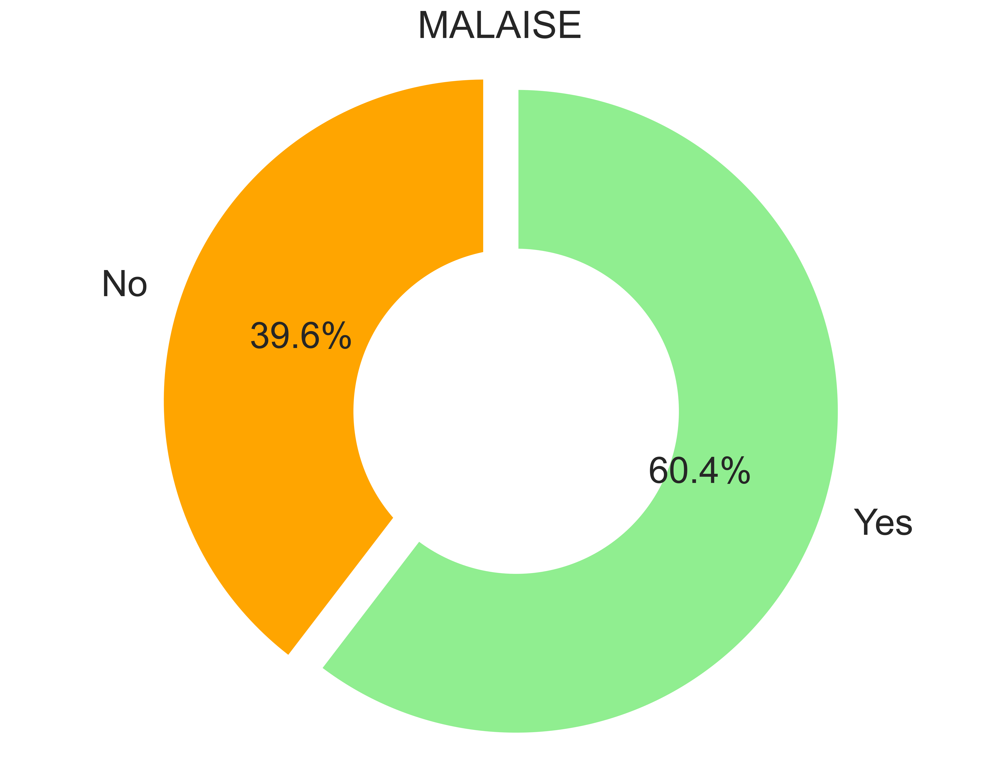

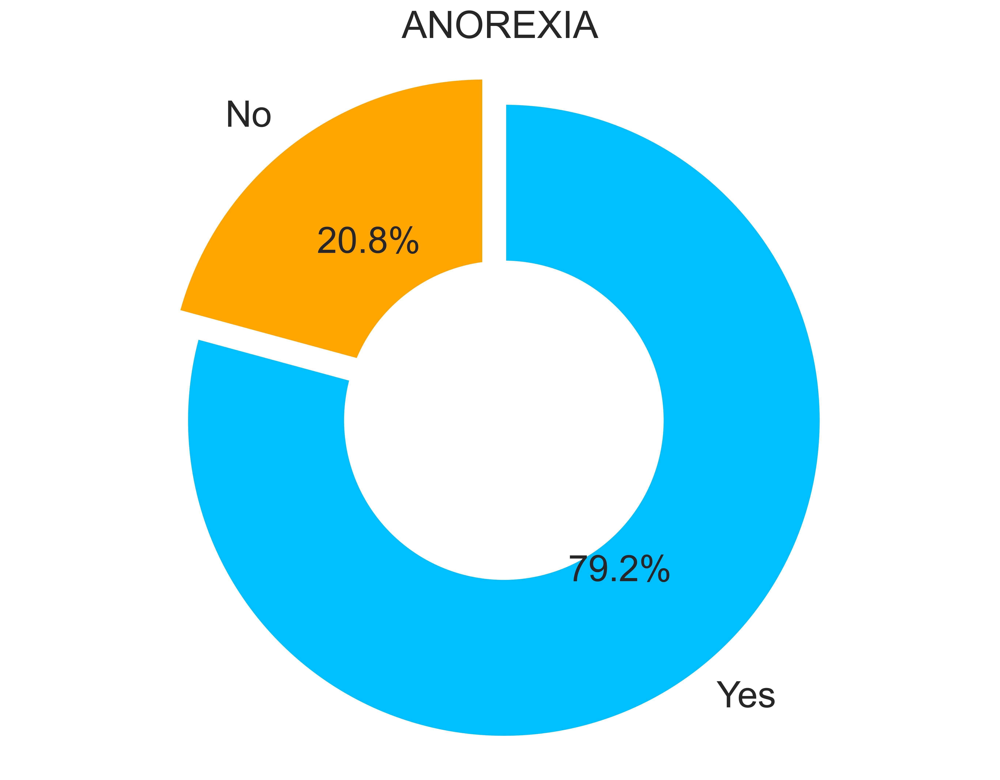

...

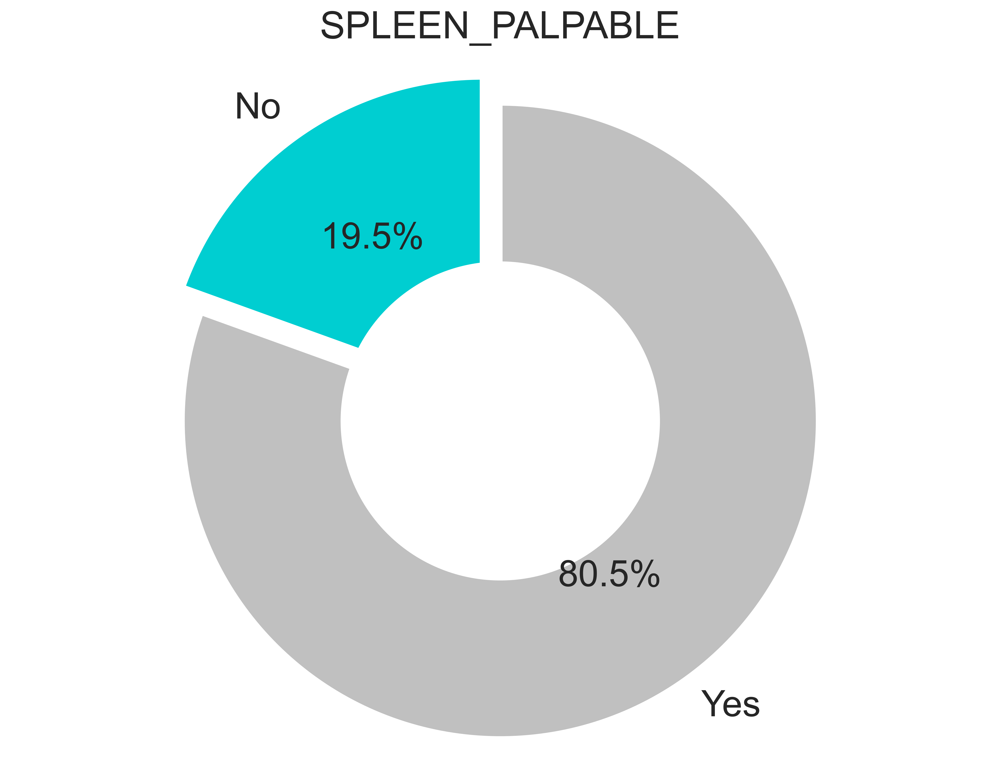

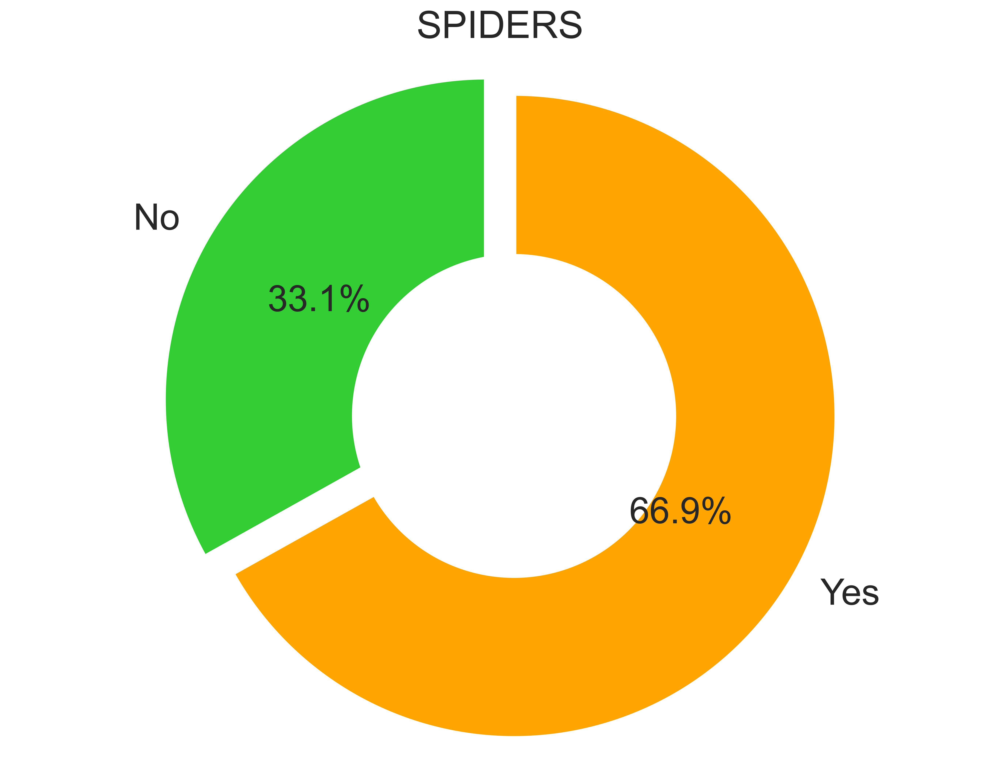

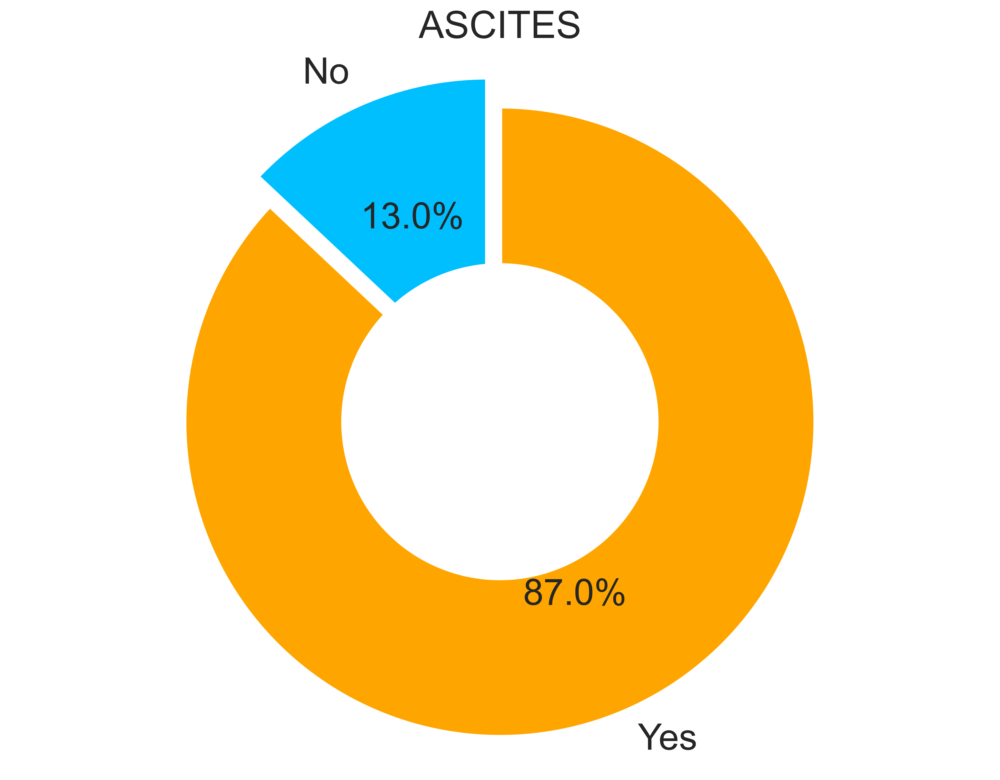

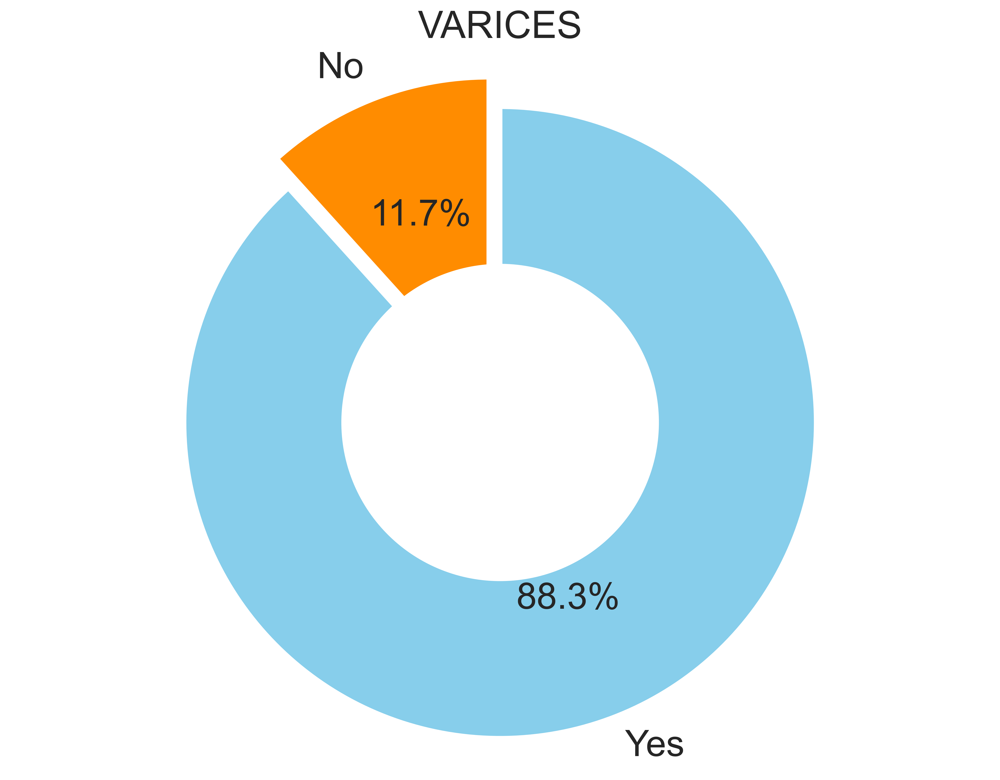

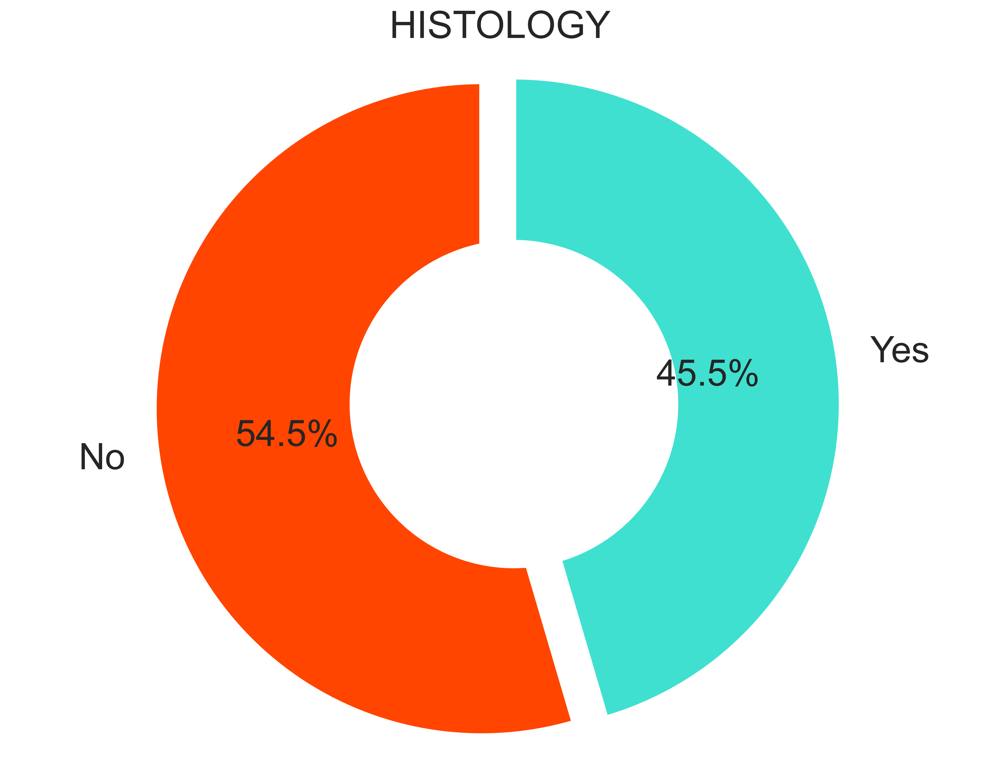

In [64]:
for i in range(len(binary_columns)):
    draw_pie_chart(
        df=df, 
        column_name=binary_columns[i], 
        labels=labels, 
        colors=colors[i], 
        dpi=600, 
        transparent=True,
        path='figures',
    )

## Scatter Plots of Continuous Attributes According to the `Age` Attributes

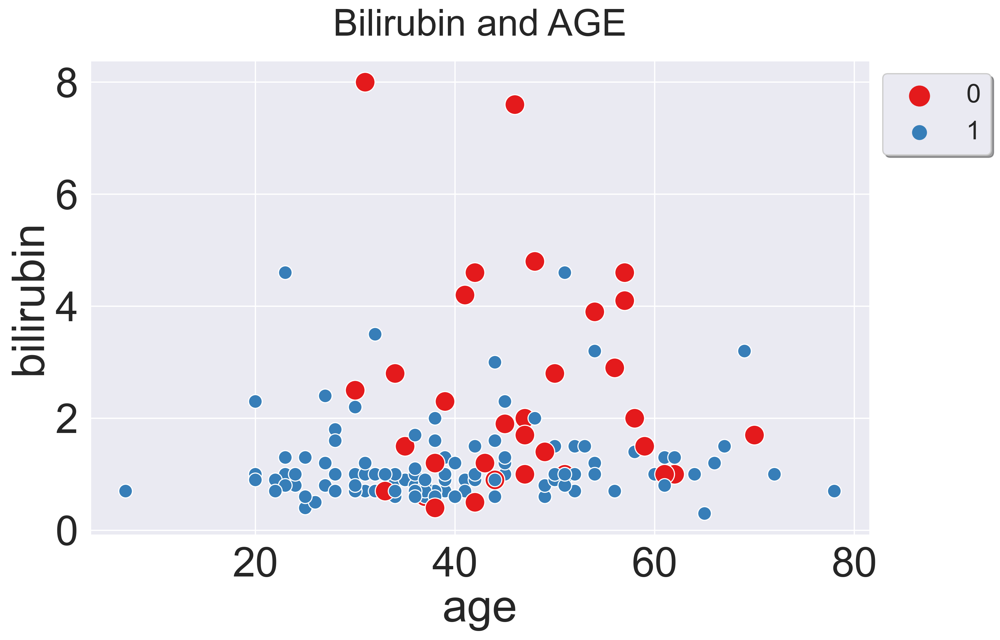

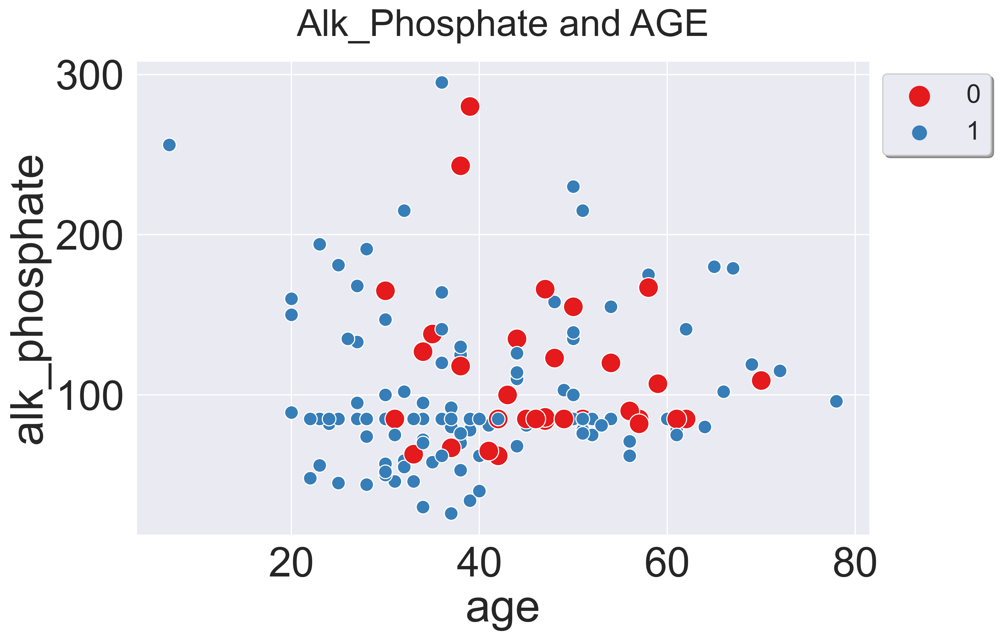

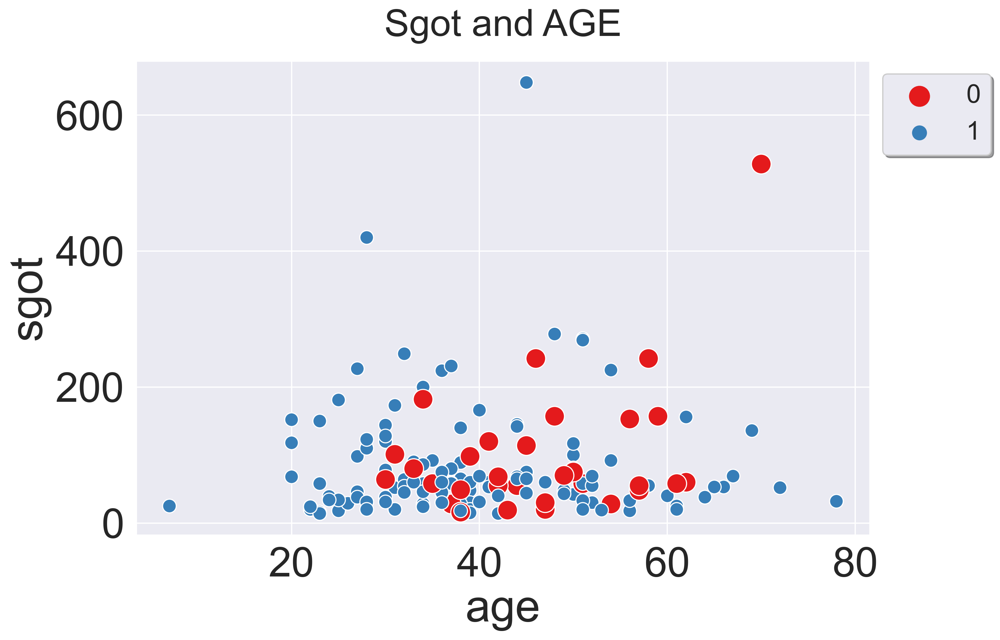

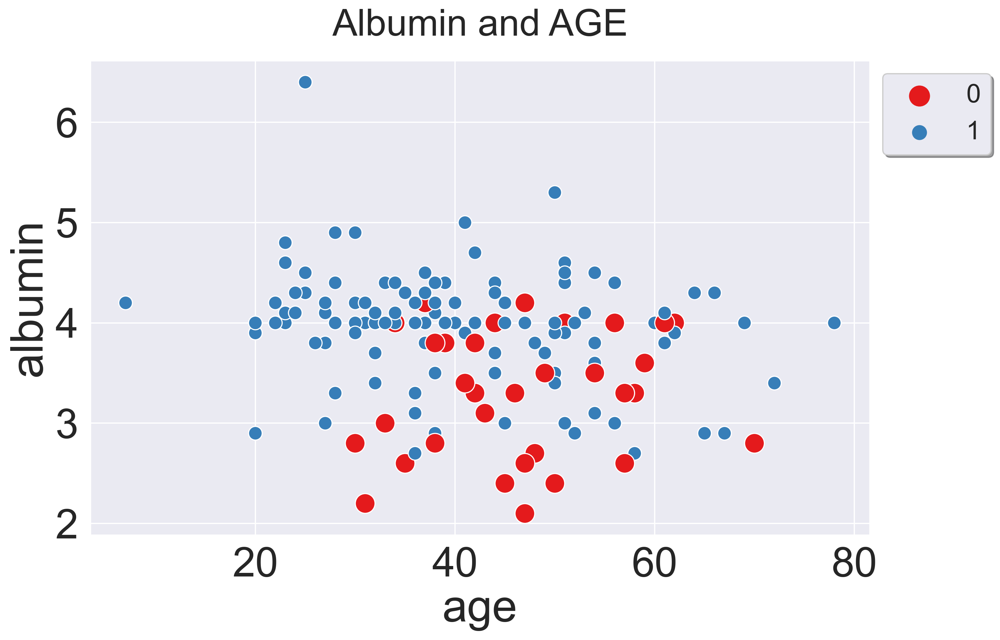

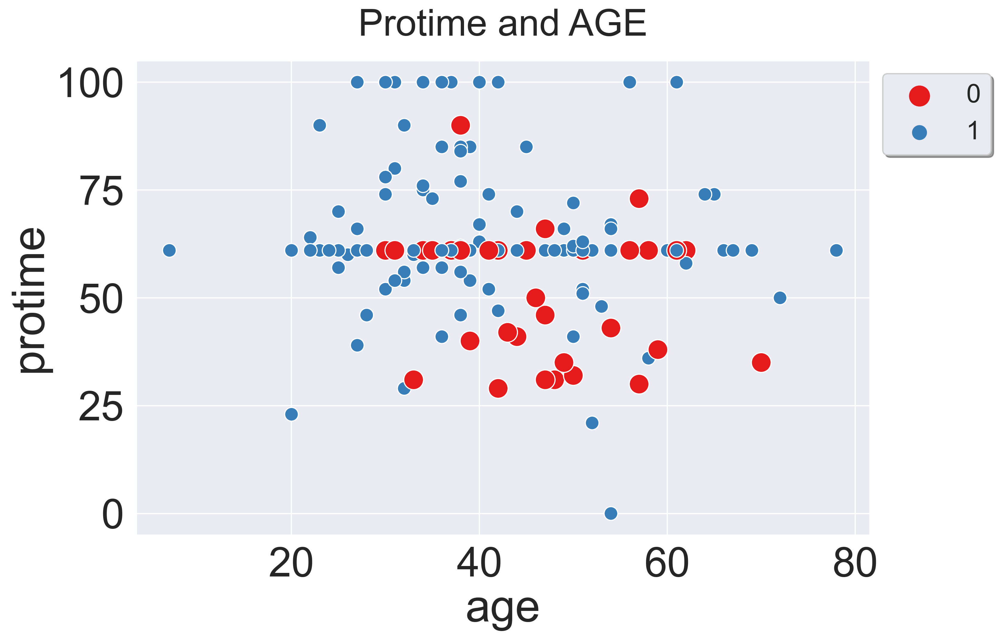

In [65]:
col_names = ['bilirubin', 'alk_phosphate', 'sgot', 'albumin', 'protime']

for col_name in col_names:
    
    plt.figure(figsize=(12, 8), dpi=300)
    
    sns.scatterplot(
        x='age', 
        y=col_name, 
        data=df, 
        hue='class',
        size='class',
        sizes=(120, 250),
        palette='Set1',
    )
    
    plt.title(f'{col_name.title()} and AGE', fontsize=30, pad=20)
    
    plt.legend(bbox_to_anchor=(1, 1), loc="upper left", fontsize='xx-small', frameon=True, shadow=True, fancybox=True)
    
    plt.tight_layout()
    
    plt.savefig(f'figures/scatter_plot_of_{col_name}.png', dpi=600, transparent=True)
    
    plt.show()

## Relationship Between Continuous Attributes and Age per Class

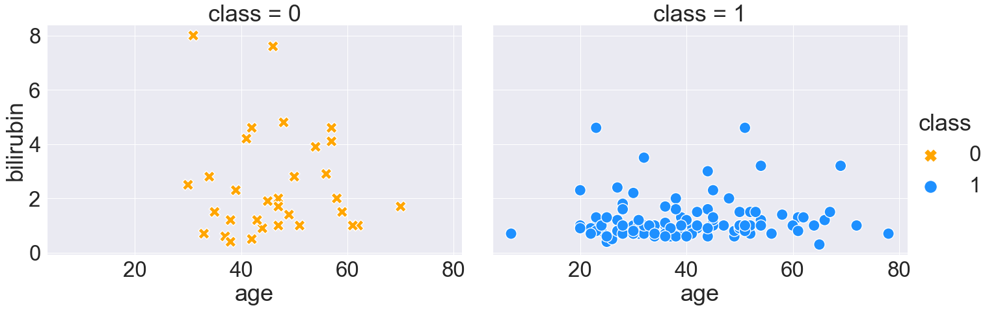

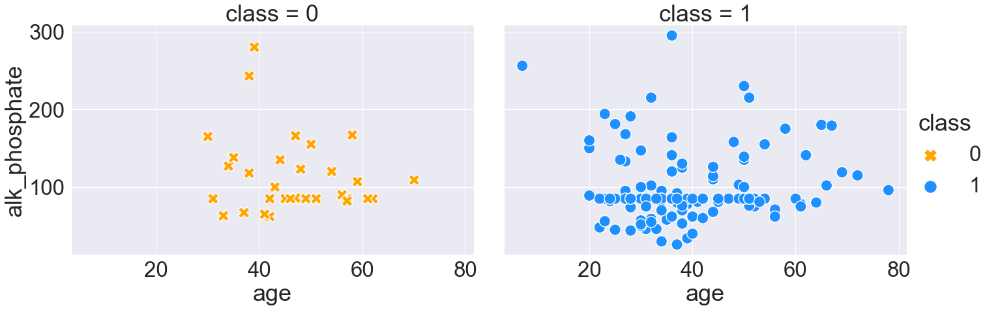

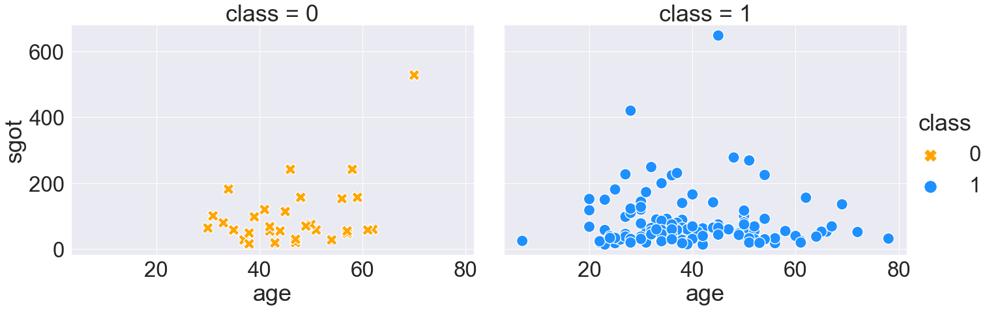

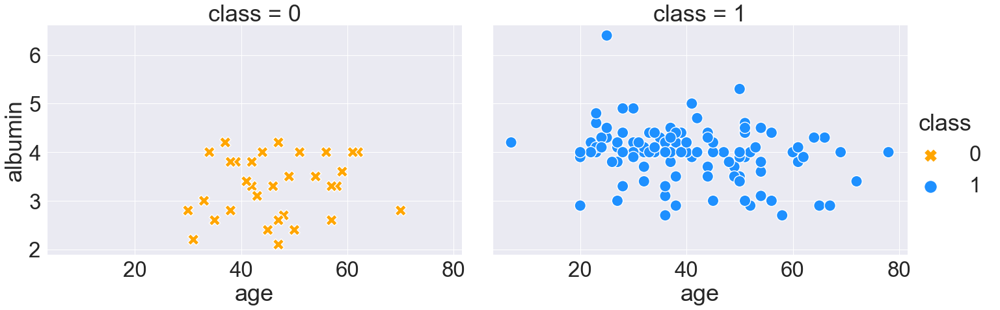

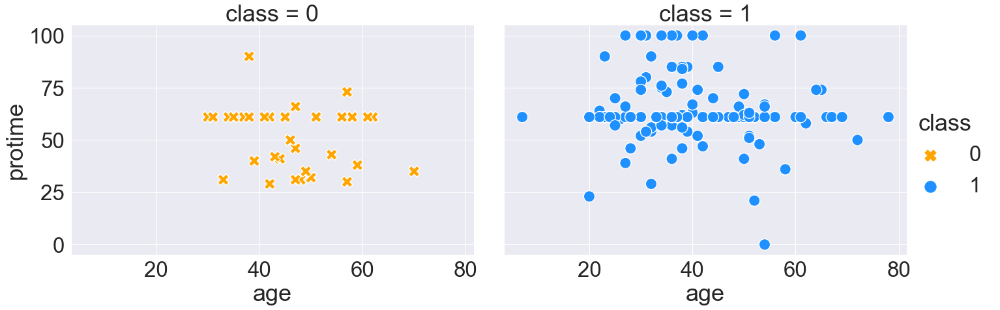

In [66]:
col_names = ['bilirubin', 'alk_phosphate', 'sgot', 'albumin', 'protime']

hue_colors = {
    0: 'orange', 
    1: 'dodgerblue',
}

markers = {
    0: 'X',
    1: 'o',
}


for col_name in col_names:
    sns.relplot(
        x='age', 
        y=col_name, 
        data=df, 
        hue='class',
        size='class',
        sizes=(300, 300),
        style='class',
        col='class',
        markers=markers,
        palette=hue_colors,
        height=7,
        aspect=1.4,

    );
    
    plt.savefig(f'figures/relationship_between_{col_name}_and_age_per_class.png', dpi=600, transparent=True)

    plt.show()

## Feature Statistics per target variable - `Mean Value`

In [67]:
features_mean_stats = df[['age', 'bilirubin', 'alk_phosphate', 'sgot', 'albumin', 'protime', target_variable]].groupby(target_variable).mean()

features_mean_stats.to_csv("csv_tables/features_mean_stats_per_target_variable.csv", index=True)
features_mean_stats

,age,bilirubin,alk_phosphate,sgot,albumin,protime
class,,,,,,
0,46.593750,2.446875,113.031250,97.218750,3.284375,51.156250
1,39.877049,1.142623,98.639344,82.565574,3.979508,64.196721


## Plot Feature Statistics per Target Variable

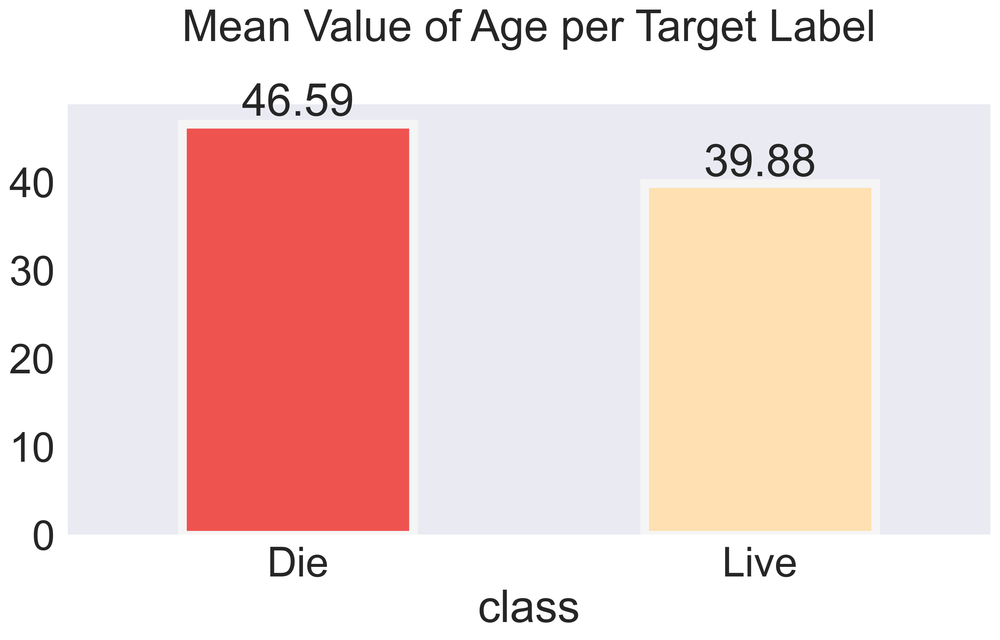

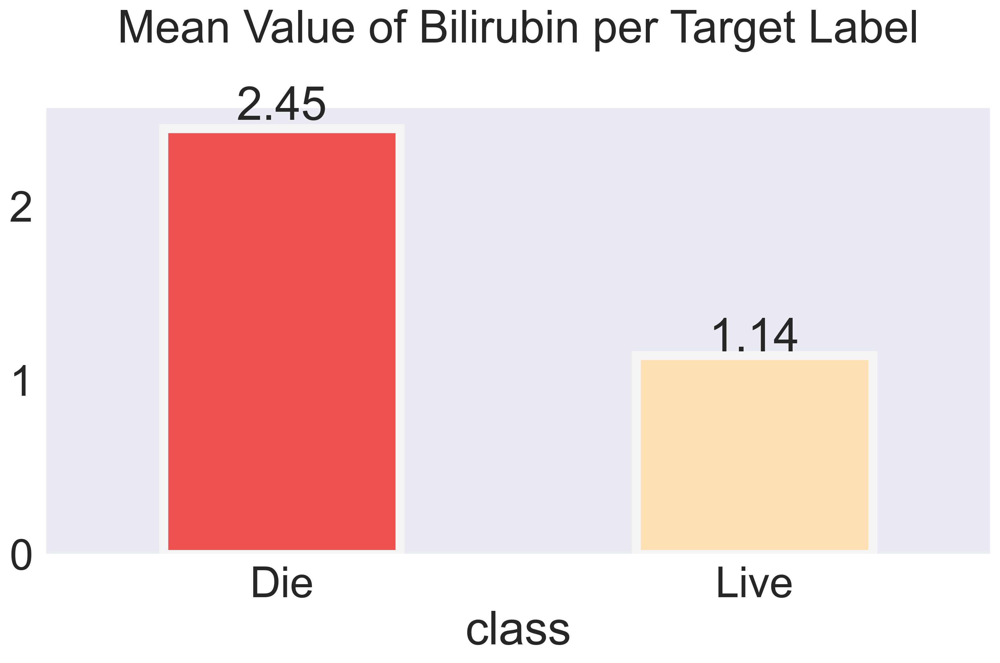

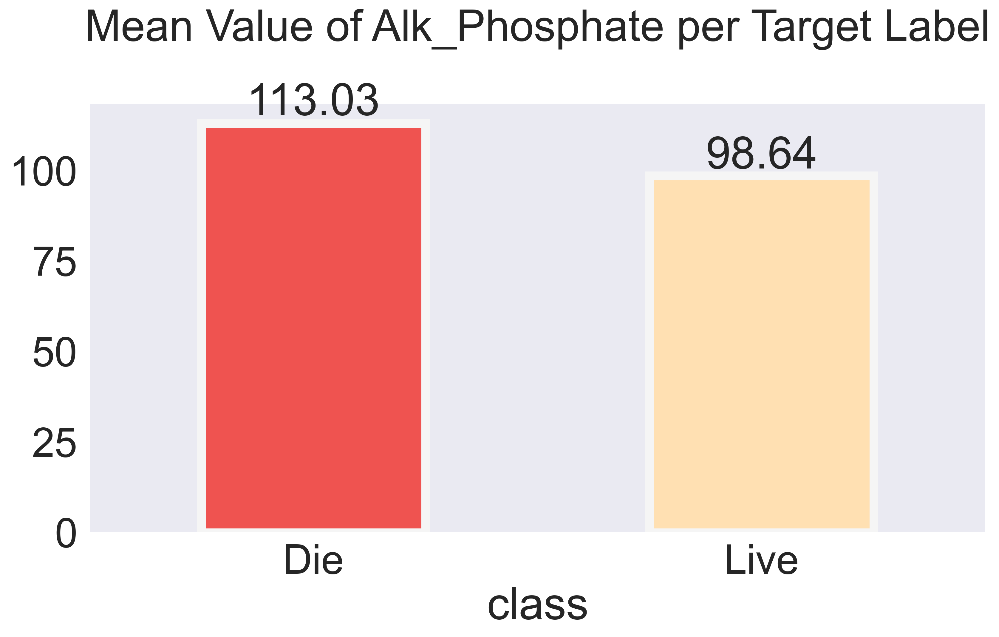

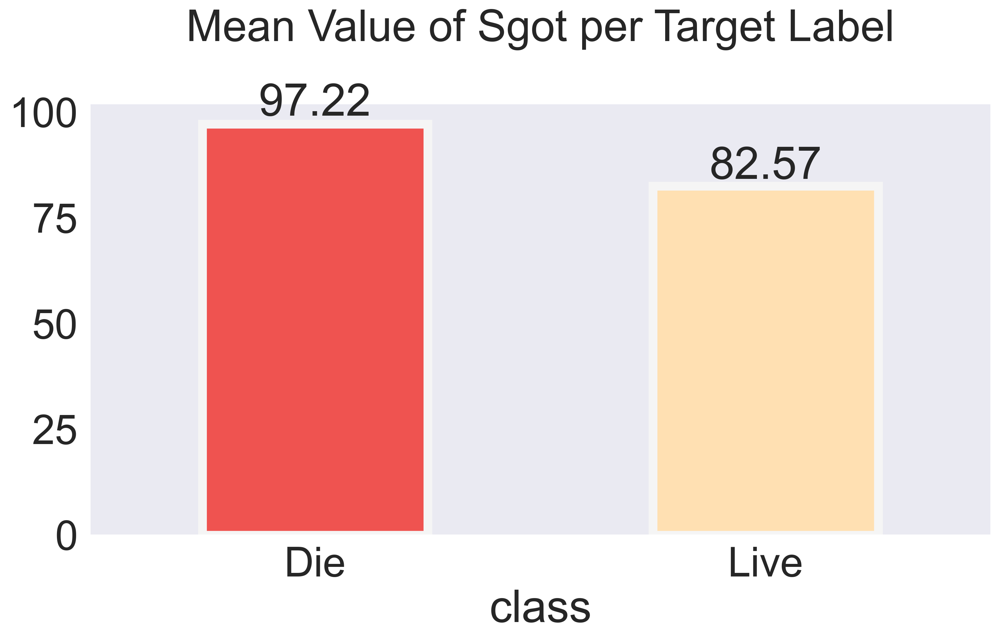

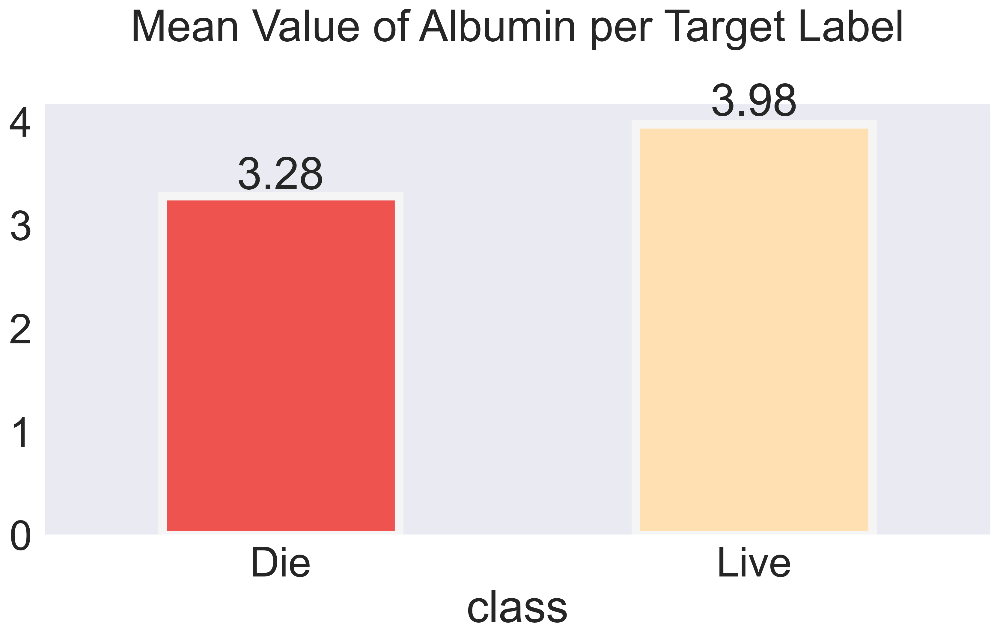

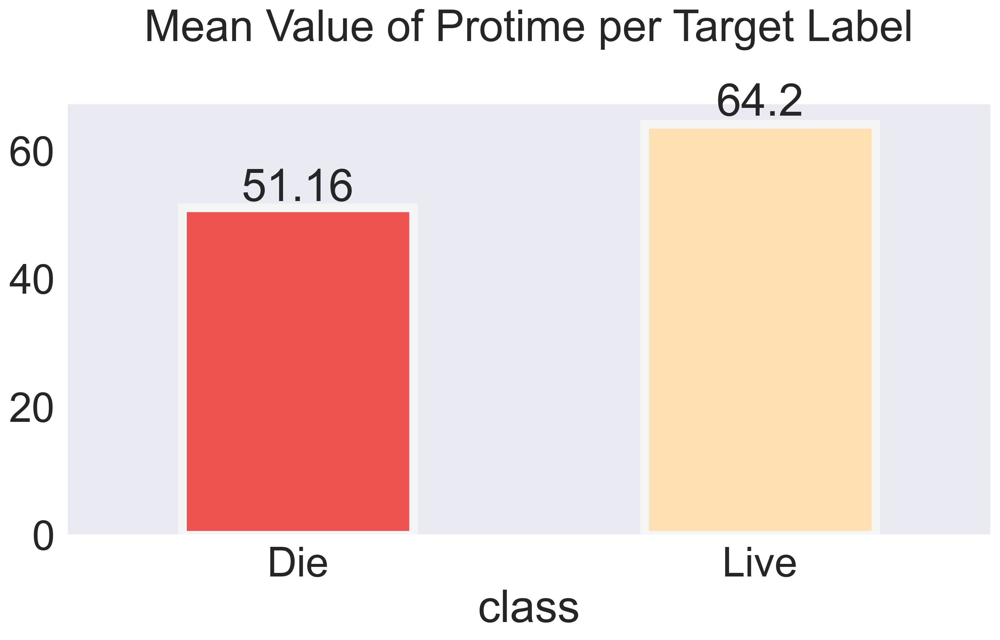

In [68]:
for col in list(features_mean_stats.columns.values):
    subset = features_mean_stats[col]
    
    fig = plt.figure(figsize=(12, 8), dpi=300)
    
    ax = subset.plot(
        kind='bar',
        color=['#EF5350', '#FFE0B2'], 
        edgecolor='#F5F5F5', 
        linewidth=7,
        rot=0,
    )
    
    plt.title(f'Mean Value of {col.title()} per Target Label', fontsize=35, pad=50)
    
    plt.xticks(ticks=np.arange(len(subset)), labels=['Die', 'Live'])
    
    plt.grid(alpha=0.2, color='grey')
    
    for patch in ax.patches:
        width = patch.get_width()
        height = patch.get_height()
        x, y = patch.get_xy()
        ax.annotate(f'{round(height, 2)}', (x + width/2, y + height*1.02), ha='center')
    
    plt.tight_layout()
    
    plt.savefig(f'figures/Mean_Value_of_{col}_per_Target_Label.png', dpi=600, transparent=True)
    plt.show()

## Feature Statistics per target variable - `Standard Deviation`

In [69]:
features_std_stats = df[['age', 'bilirubin', 'alk_phosphate', 'sgot', 'albumin', 'protime', target_variable]].groupby(target_variable).std()

features_std_stats.to_csv("csv_tables/features_std_stats_per_target_variable.csv", index=True)
features_std_stats

,age,bilirubin,alk_phosphate,sgot,albumin,protime
class,,,,,,
0,9.944554,1.914458,49.617560,98.966835,0.634039,15.227542
1,12.850429,0.713497,46.312818,86.004611,0.532566,16.775937


## Create a Final Copy of the Dataset

In [70]:
df_modified = df.copy()
df_modified.head(15)

,class,age,steroid,antivirals,fatigue,malaise,anorexia,liver_big,liver_firm,spleen_palpable,spiders,ascites,varices,bilirubin,alk_phosphate,sgot,albumin,protime,histology
0,1,50,0,1,0,1,1,0,1,1,1,1,1,0.9,135,42,3.5,61,0
1,1,78,1,1,0,1,1,1,1,1,1,1,1,0.7,96,32,4.0,61,0
2,1,31,1,0,1,1,1,1,1,1,1,1,1,0.7,46,52,4.0,80,0
3,1,34,1,1,1,1,1,1,1,1,1,1,1,1.0,85,200,4.0,61,0
4,1,34,1,1,1,1,1,1,1,1,1,1,1,0.9,95,28,4.0,75,0
5,0,51,0,1,0,1,0,1,1,0,0,1,1,1.0,85,58,4.0,61,0
6,1,23,1,1,1,1,1,1,1,1,1,1,1,1.0,85,58,4.0,61,0
7,1,39,1,1,0,1,1,1,0,1,1,1,1,0.7,85,48,4.4,61,0
8,1,30,1,1,1,1,1,1,1,1,1,1,1,1.0,85,120,3.9,61,0
9,1,39,0,0,1,1,1,0,0,1,1,1,1,1.3,78,30,4.4,85,0


## Save the Modified Dataset as csv

In [71]:
df_modified.to_csv("data/cleaned_data.csv", index=False)

# Data Sources:
---

+ **_[Hepatistis Dataset](https://archive.ics.uci.edu/ml/datasets/hepatitis)_** Dua, D. and Graff, C. (2019). **_[UCI Machine Learning Repository](http://archive.ics.uci.edu/ml)_**. Irvine, CA: University of California, School of Information and Computer Science.


---

+ **_[Kaggle](https://www.kaggle.com/kalpakchepurwar/hepatitis-data)_**

![Kaggle](src/kaggle.png)